# Norman

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import rapids_singlecell as rsc
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: True


In [3]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [4]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    adata_file_path = os.path.join(tardis.config.io_directories["processed"], "cpa_Norman2019_prep_new.h5ad")
    assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
    adata = ad.read_h5ad(adata_file_path)
    adata.X = adata.layers["counts"].copy()
    del adata.layers
    gc.collect()
adata

AnnData object with n_obs × n_vars = 108497 × 5000
    obs: 'cov_drug_dose_name', 'dose_val', 'control', 'condition', 'guide_identity', 'drug_dose_name', 'cell_type', 'split', 'split1', 'split2', 'split3', 'split4', 'split5', 'split6', 'split7', 'split8', 'split9', 'split10', 'split11', 'split12', 'split13', 'split14', 'split15', 'split16', 'split17', 'split18', 'split19', 'split20', 'split21', 'split22', 'split23', 'split24', 'split25'
    var: 'gene_symbols', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'rank_genes_groups_cov'

## Train

In [5]:
warmup_epoch_range = [6, 48]
dtc_w1 = 400
dtc_w2 = 40

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "condition",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            )
        ]
    )
]

In [6]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(12 + 12 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.25,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
    encode_covariates=False
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=128,
    check_val_every_n_epoch=10,
    limit_train_batches=0.5, 
    limit_val_batches=0.5,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-4,
        weight_decay=1e-4,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=None,
    model_level_metrics_helper_covariates=None
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

CUDA backend failed to initialize: Found cuDNN version 8700, but JAX was built against version 8907, which is newer. The copy of cuDNN that is installed must be at least as new as the version against which JAX was built. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: o02lxw48
Name: cool-glade-604
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/o02lxw48
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240507_004258-o02lxw48/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
You are using a CUDA device ('NVIDIA A100 80GB PCIe') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|          | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `training` set. Number of elements in each group: 212,400,427,191,389,298,563,134,469,379,422,377,240,278,48,213,434,293,277,551,247,268,157,54,326,149,101,287,102,89,178,193,50,338,226,166,257,151,90,186,369,449,332,976,142,389,179,190,283,299,241,135,380,273,262,375,300,648,316,291,229,600,238,144,256,345,283,742,336,376,258,355,364,346,128,234,220,153,59,117,198,503,303,284,333,219,153,234,385,179,140,102,259,408,157,172,440,80,153,305,176,366,99,240,186,221,313,129,140,300,279,116,109,352,339,358,264,41,49,222,213,266,81,206,324,236,194,228,284,199,961,271,195,530,297,156,502,336,499,461,204,458,470,276,363,232,352,248,301,306,281,242,252,383,391,245,232,183,155,615,251,235,134,153,169,156,529,243,380,206,290,401,609,428,299,254,227,229,174,167,203,186,197,236,602,358,317,351,375,7164,421,262,198,175,359,169,268,262,158,32

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `validation` set. Number of elements in each group: 64,81,131,41,106,81,124,41,113,84,111,87,61,80,11,51,128,72,71,112,59,67,31,10,84,35,33,77,24,18,52,52,14,74,60,45,74,29,24,51,99,117,83,243,37,86,36,51,72,99,44,43,90,55,67,103,87,139,66,75,61,131,59,39,66,80,71,163,105,69,66,104,87,99,31,50,57,38,12,34,49,127,79,61,93,53,39,61,94,37,35,28,70,86,35,28,112,16,40,63,39,97,27,63,51,53,97,38,43,68,70,24,32,93,88,86,63,13,10,44,65,63,15,48,71,75,43,70,77,64,236,66,46,117,78,36,121,96,127,120,57,113,109,62,88,68,92,54,62,60,58,60,67,117,106,68,66,54,37,155,59,58,42,33,46,46,138,72,100,63,55,111,141,85,73,68,57,62,44,55,61,50,58,69,161,76,95,95,88,1743,109,87,47,36,87,48,63,70,42,78,29,78,70,87,63,122,63,60,80,32,18,48,58,69,21,68,69,83,38,53,62,75,59,59,67,40,67,62,50,70,66,95,45,86,13,49,30,137,141,131,94,71,59,65,200,121,21,39,6

Epoch 1/600:   0%|          | 1/600 [00:15<2:36:31, 15.68s/it]

Epoch 1/600:   0%|          | 1/600 [00:15<2:36:31, 15.68s/it, v_num=48_1, total_loss_train=1.9e+3, kl_local_train=62.5]

Epoch 2/600:   0%|          | 1/600 [00:15<2:36:31, 15.68s/it, v_num=48_1, total_loss_train=1.9e+3, kl_local_train=62.5]

Epoch 2/600:   0%|          | 2/600 [00:21<1:38:50,  9.92s/it, v_num=48_1, total_loss_train=1.9e+3, kl_local_train=62.5]

Epoch 2/600:   0%|          | 2/600 [00:21<1:38:50,  9.92s/it, v_num=48_1, total_loss_train=1.35e+3, kl_local_train=78.1]

Epoch 3/600:   0%|          | 2/600 [00:21<1:38:50,  9.92s/it, v_num=48_1, total_loss_train=1.35e+3, kl_local_train=78.1]

Epoch 3/600:   0%|          | 3/600 [00:27<1:20:15,  8.07s/it, v_num=48_1, total_loss_train=1.35e+3, kl_local_train=78.1]

Epoch 3/600:   0%|          | 3/600 [00:27<1:20:15,  8.07s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=74.3]

Epoch 4/600:   0%|          | 3/600 [00:27<1:20:15,  8.07s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=74.3]

Epoch 4/600:   1%|          | 4/600 [00:33<1:11:27,  7.19s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=74.3]

Epoch 4/600:   1%|          | 4/600 [00:33<1:11:27,  7.19s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=62.3]

Epoch 5/600:   1%|          | 4/600 [00:33<1:11:27,  7.19s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=62.3]

Epoch 5/600:   1%|          | 5/600 [00:39<1:06:30,  6.71s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=62.3]

Epoch 5/600:   1%|          | 5/600 [00:39<1:06:30,  6.71s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=39.5]

Epoch 6/600:   1%|          | 5/600 [00:39<1:06:30,  6.71s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=39.5]

Epoch 6/600:   1%|          | 6/600 [00:45<1:03:39,  6.43s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=39.5]

Epoch 6/600:   1%|          | 6/600 [00:45<1:03:39,  6.43s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=38.2] 

Epoch 7/600:   1%|          | 6/600 [00:45<1:03:39,  6.43s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=38.2]

Epoch 7/600:   1%|          | 7/600 [00:50<1:01:47,  6.25s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=38.2]

Epoch 7/600:   1%|          | 7/600 [00:50<1:01:47,  6.25s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=46.5]

Epoch 8/600:   1%|          | 7/600 [00:50<1:01:47,  6.25s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=46.5]

Epoch 8/600:   1%|▏         | 8/600 [00:56<1:00:28,  6.13s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=46.5]

Epoch 8/600:   1%|▏         | 8/600 [00:56<1:00:28,  6.13s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=52.8]

Epoch 9/600:   1%|▏         | 8/600 [00:56<1:00:28,  6.13s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=52.8]

Epoch 9/600:   2%|▏         | 9/600 [01:02<59:32,  6.04s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=52.8]  

Epoch 9/600:   2%|▏         | 9/600 [01:02<59:32,  6.04s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=68.3]

Epoch 10/600:   2%|▏         | 9/600 [01:02<59:32,  6.04s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=68.3]

Epoch 10/600:   2%|▏         | 10/600 [01:08<58:53,  5.99s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=68.3]

Epoch 10/600:   2%|▏         | 10/600 [01:08<58:53,  5.99s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=96.3]

Epoch 11/600:   2%|▏         | 10/600 [01:08<58:53,  5.99s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=96.3]

Epoch 11/600:   2%|▏         | 11/600 [01:14<58:37,  5.97s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=96.3]

Epoch 11/600:   2%|▏         | 11/600 [01:14<58:37,  5.97s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=120] 

Epoch 12/600:   2%|▏         | 11/600 [01:14<58:37,  5.97s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=120]

Epoch 12/600:   2%|▏         | 12/600 [01:20<58:14,  5.94s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=120]

Epoch 12/600:   2%|▏         | 12/600 [01:20<58:14,  5.94s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=146]

Epoch 13/600:   2%|▏         | 12/600 [01:20<58:14,  5.94s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=146]

Epoch 13/600:   2%|▏         | 13/600 [01:26<57:56,  5.92s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=146]

Epoch 13/600:   2%|▏         | 13/600 [01:26<57:56,  5.92s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=162]

Epoch 14/600:   2%|▏         | 13/600 [01:26<57:56,  5.92s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=162]

Epoch 14/600:   2%|▏         | 14/600 [01:32<57:40,  5.91s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=162]

Epoch 14/600:   2%|▏         | 14/600 [01:32<57:40,  5.91s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=164]

Epoch 15/600:   2%|▏         | 14/600 [01:32<57:40,  5.91s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=164]

Epoch 15/600:   2%|▎         | 15/600 [01:37<57:27,  5.89s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=164]

Epoch 15/600:   2%|▎         | 15/600 [01:37<57:27,  5.89s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=136]

Epoch 16/600:   2%|▎         | 15/600 [01:37<57:27,  5.89s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=136]

Epoch 16/600:   3%|▎         | 16/600 [01:43<57:20,  5.89s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=136]

Epoch 16/600:   3%|▎         | 16/600 [01:43<57:20,  5.89s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=145]

Epoch 17/600:   3%|▎         | 16/600 [01:43<57:20,  5.89s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=145]

Epoch 17/600:   3%|▎         | 17/600 [01:49<57:11,  5.89s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=145]

Epoch 17/600:   3%|▎         | 17/600 [01:49<57:11,  5.89s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=167]

Epoch 18/600:   3%|▎         | 17/600 [01:49<57:11,  5.89s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=167]

Epoch 18/600:   3%|▎         | 18/600 [01:55<57:06,  5.89s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=167]

Epoch 18/600:   3%|▎         | 18/600 [01:55<57:06,  5.89s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=158]

Epoch 19/600:   3%|▎         | 18/600 [01:55<57:06,  5.89s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=158]

Epoch 19/600:   3%|▎         | 19/600 [02:01<57:01,  5.89s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=158]

Epoch 19/600:   3%|▎         | 19/600 [02:01<57:01,  5.89s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=148]

Epoch 20/600:   3%|▎         | 19/600 [02:01<57:01,  5.89s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=148]

Epoch 20/600:   3%|▎         | 20/600 [02:07<56:54,  5.89s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=148]

Epoch 20/600:   3%|▎         | 20/600 [02:07<56:54,  5.89s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=144]

Epoch 21/600:   3%|▎         | 20/600 [02:07<56:54,  5.89s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=144]

Epoch 21/600:   4%|▎         | 21/600 [02:13<56:51,  5.89s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=144]

Epoch 21/600:   4%|▎         | 21/600 [02:13<56:51,  5.89s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=149] 

Epoch 22/600:   4%|▎         | 21/600 [02:13<56:51,  5.89s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=149]

Epoch 22/600:   4%|▎         | 22/600 [02:19<56:43,  5.89s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=149]

Epoch 22/600:   4%|▎         | 22/600 [02:19<56:43,  5.89s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=154]

Epoch 23/600:   4%|▎         | 22/600 [02:19<56:43,  5.89s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=154]

Epoch 23/600:   4%|▍         | 23/600 [02:25<56:36,  5.89s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=154]

Epoch 23/600:   4%|▍         | 23/600 [02:25<56:36,  5.89s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=164]

Epoch 24/600:   4%|▍         | 23/600 [02:25<56:36,  5.89s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=164]

Epoch 24/600:   4%|▍         | 24/600 [02:30<56:26,  5.88s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=164]

Epoch 24/600:   4%|▍         | 24/600 [02:30<56:26,  5.88s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=175]

Epoch 25/600:   4%|▍         | 24/600 [02:30<56:26,  5.88s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=175]

Epoch 25/600:   4%|▍         | 25/600 [02:36<56:18,  5.88s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=175]

Epoch 25/600:   4%|▍         | 25/600 [02:36<56:18,  5.88s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=177]

Epoch 26/600:   4%|▍         | 25/600 [02:36<56:18,  5.88s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=177]

Epoch 26/600:   4%|▍         | 26/600 [02:42<56:18,  5.89s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=177]

Epoch 26/600:   4%|▍         | 26/600 [02:42<56:18,  5.89s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=173]

Epoch 27/600:   4%|▍         | 26/600 [02:42<56:18,  5.89s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=173]

Epoch 27/600:   4%|▍         | 27/600 [02:48<56:10,  5.88s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=173]

Epoch 27/600:   4%|▍         | 27/600 [02:48<56:10,  5.88s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=187]

Epoch 28/600:   4%|▍         | 27/600 [02:48<56:10,  5.88s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=187]

Epoch 28/600:   5%|▍         | 28/600 [02:54<56:01,  5.88s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=187]

Epoch 28/600:   5%|▍         | 28/600 [02:54<56:01,  5.88s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=194]

Epoch 29/600:   5%|▍         | 28/600 [02:54<56:01,  5.88s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=194]

Epoch 29/600:   5%|▍         | 29/600 [03:00<55:54,  5.88s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=194]

Epoch 29/600:   5%|▍         | 29/600 [03:00<55:54,  5.88s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=192]

Epoch 30/600:   5%|▍         | 29/600 [03:00<55:54,  5.88s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=192]

Epoch 30/600:   5%|▌         | 30/600 [03:06<55:50,  5.88s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=192]

Epoch 30/600:   5%|▌         | 30/600 [03:06<55:50,  5.88s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=199]

Epoch 31/600:   5%|▌         | 30/600 [03:06<55:50,  5.88s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=199]

Epoch 31/600:   5%|▌         | 31/600 [03:11<55:42,  5.87s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=199]

Epoch 31/600:   5%|▌         | 31/600 [03:12<55:42,  5.87s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=182]

Epoch 32/600:   5%|▌         | 31/600 [03:12<55:42,  5.87s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=182]

Epoch 32/600:   5%|▌         | 32/600 [03:17<55:33,  5.87s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=182]

Epoch 32/600:   5%|▌         | 32/600 [03:17<55:33,  5.87s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=178]

Epoch 33/600:   5%|▌         | 32/600 [03:17<55:33,  5.87s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=178]

Epoch 33/600:   6%|▌         | 33/600 [03:23<55:42,  5.90s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=178]

Epoch 33/600:   6%|▌         | 33/600 [03:23<55:42,  5.90s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=151]

Epoch 34/600:   6%|▌         | 33/600 [03:23<55:42,  5.90s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=151]

Epoch 34/600:   6%|▌         | 34/600 [03:29<55:40,  5.90s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=151]

Epoch 34/600:   6%|▌         | 34/600 [03:29<55:40,  5.90s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=128]

Epoch 35/600:   6%|▌         | 34/600 [03:29<55:40,  5.90s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=128]

Epoch 35/600:   6%|▌         | 35/600 [03:35<55:33,  5.90s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=128]

Epoch 35/600:   6%|▌         | 35/600 [03:35<55:33,  5.90s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=123]

Epoch 36/600:   6%|▌         | 35/600 [03:35<55:33,  5.90s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=123]

Epoch 36/600:   6%|▌         | 36/600 [03:41<55:27,  5.90s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=123]

Epoch 36/600:   6%|▌         | 36/600 [03:41<55:27,  5.90s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=143]

Epoch 37/600:   6%|▌         | 36/600 [03:41<55:27,  5.90s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=143]

Epoch 37/600:   6%|▌         | 37/600 [03:47<55:21,  5.90s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=143]

Epoch 37/600:   6%|▌         | 37/600 [03:47<55:21,  5.90s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=169]

Epoch 38/600:   6%|▌         | 37/600 [03:47<55:21,  5.90s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=169]

Epoch 38/600:   6%|▋         | 38/600 [03:53<55:13,  5.90s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=169]

Epoch 38/600:   6%|▋         | 38/600 [03:53<55:13,  5.90s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=199]

Epoch 39/600:   6%|▋         | 38/600 [03:53<55:13,  5.90s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=199]

Epoch 39/600:   6%|▋         | 39/600 [03:59<55:07,  5.90s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=199]

Epoch 39/600:   6%|▋         | 39/600 [03:59<55:07,  5.90s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=191]

Epoch 40/600:   6%|▋         | 39/600 [03:59<55:07,  5.90s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=191]

Epoch 40/600:   7%|▋         | 40/600 [04:05<54:56,  5.89s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=191]

Epoch 40/600:   7%|▋         | 40/600 [04:05<54:56,  5.89s/it, v_num=48_1, total_loss_train=1.34e+3, kl_local_train=193]

Epoch 41/600:   7%|▋         | 40/600 [04:05<54:56,  5.89s/it, v_num=48_1, total_loss_train=1.34e+3, kl_local_train=193]

Epoch 41/600:   7%|▋         | 41/600 [04:10<54:48,  5.88s/it, v_num=48_1, total_loss_train=1.34e+3, kl_local_train=193]

Epoch 41/600:   7%|▋         | 41/600 [04:10<54:48,  5.88s/it, v_num=48_1, total_loss_train=1.34e+3, kl_local_train=192]

Epoch 42/600:   7%|▋         | 41/600 [04:10<54:48,  5.88s/it, v_num=48_1, total_loss_train=1.34e+3, kl_local_train=192]

Epoch 42/600:   7%|▋         | 42/600 [04:16<54:41,  5.88s/it, v_num=48_1, total_loss_train=1.34e+3, kl_local_train=192]

Epoch 42/600:   7%|▋         | 42/600 [04:16<54:41,  5.88s/it, v_num=48_1, total_loss_train=1.34e+3, kl_local_train=179]

Epoch 43/600:   7%|▋         | 42/600 [04:16<54:41,  5.88s/it, v_num=48_1, total_loss_train=1.34e+3, kl_local_train=179]

Epoch 43/600:   7%|▋         | 43/600 [04:22<54:33,  5.88s/it, v_num=48_1, total_loss_train=1.34e+3, kl_local_train=179]

Epoch 43/600:   7%|▋         | 43/600 [04:22<54:33,  5.88s/it, v_num=48_1, total_loss_train=1.35e+3, kl_local_train=192]

Epoch 44/600:   7%|▋         | 43/600 [04:22<54:33,  5.88s/it, v_num=48_1, total_loss_train=1.35e+3, kl_local_train=192]

Epoch 44/600:   7%|▋         | 44/600 [04:28<54:30,  5.88s/it, v_num=48_1, total_loss_train=1.35e+3, kl_local_train=192]

Epoch 44/600:   7%|▋         | 44/600 [04:28<54:30,  5.88s/it, v_num=48_1, total_loss_train=1.35e+3, kl_local_train=200]

Epoch 45/600:   7%|▋         | 44/600 [04:28<54:30,  5.88s/it, v_num=48_1, total_loss_train=1.35e+3, kl_local_train=200]

Epoch 45/600:   8%|▊         | 45/600 [04:34<54:25,  5.88s/it, v_num=48_1, total_loss_train=1.35e+3, kl_local_train=200]

Epoch 45/600:   8%|▊         | 45/600 [04:34<54:25,  5.88s/it, v_num=48_1, total_loss_train=1.35e+3, kl_local_train=199]

Epoch 46/600:   8%|▊         | 45/600 [04:34<54:25,  5.88s/it, v_num=48_1, total_loss_train=1.35e+3, kl_local_train=199]

Epoch 46/600:   8%|▊         | 46/600 [04:40<54:23,  5.89s/it, v_num=48_1, total_loss_train=1.35e+3, kl_local_train=199]

Epoch 46/600:   8%|▊         | 46/600 [04:40<54:23,  5.89s/it, v_num=48_1, total_loss_train=1.35e+3, kl_local_train=195]

Epoch 47/600:   8%|▊         | 46/600 [04:40<54:23,  5.89s/it, v_num=48_1, total_loss_train=1.35e+3, kl_local_train=195]

Epoch 47/600:   8%|▊         | 47/600 [04:46<54:22,  5.90s/it, v_num=48_1, total_loss_train=1.35e+3, kl_local_train=195]

Epoch 47/600:   8%|▊         | 47/600 [04:46<54:22,  5.90s/it, v_num=48_1, total_loss_train=1.36e+3, kl_local_train=181]

Epoch 48/600:   8%|▊         | 47/600 [04:46<54:22,  5.90s/it, v_num=48_1, total_loss_train=1.36e+3, kl_local_train=181]

Epoch 48/600:   8%|▊         | 48/600 [04:52<54:13,  5.89s/it, v_num=48_1, total_loss_train=1.36e+3, kl_local_train=181]

Epoch 48/600:   8%|▊         | 48/600 [04:52<54:13,  5.89s/it, v_num=48_1, total_loss_train=1.36e+3, kl_local_train=179]

Epoch 49/600:   8%|▊         | 48/600 [04:52<54:13,  5.89s/it, v_num=48_1, total_loss_train=1.36e+3, kl_local_train=179]

Epoch 49/600:   8%|▊         | 49/600 [04:58<54:07,  5.89s/it, v_num=48_1, total_loss_train=1.36e+3, kl_local_train=179]

Epoch 49/600:   8%|▊         | 49/600 [04:58<54:07,  5.89s/it, v_num=48_1, total_loss_train=1.36e+3, kl_local_train=182]

Epoch 50/600:   8%|▊         | 49/600 [04:58<54:07,  5.89s/it, v_num=48_1, total_loss_train=1.36e+3, kl_local_train=182]

Epoch 50/600:   8%|▊         | 50/600 [05:03<54:02,  5.90s/it, v_num=48_1, total_loss_train=1.36e+3, kl_local_train=182]

Epoch 50/600:   8%|▊         | 50/600 [05:03<54:02,  5.90s/it, v_num=48_1, total_loss_train=1.37e+3, kl_local_train=172]

Epoch 51/600:   8%|▊         | 50/600 [05:03<54:02,  5.90s/it, v_num=48_1, total_loss_train=1.37e+3, kl_local_train=172]

Epoch 51/600:   8%|▊         | 51/600 [05:09<53:58,  5.90s/it, v_num=48_1, total_loss_train=1.37e+3, kl_local_train=172]

Epoch 51/600:   8%|▊         | 51/600 [05:09<53:58,  5.90s/it, v_num=48_1, total_loss_train=1.36e+3, kl_local_train=163]

Epoch 52/600:   8%|▊         | 51/600 [05:09<53:58,  5.90s/it, v_num=48_1, total_loss_train=1.36e+3, kl_local_train=163]

Epoch 52/600:   9%|▊         | 52/600 [05:15<54:17,  5.94s/it, v_num=48_1, total_loss_train=1.36e+3, kl_local_train=163]

Epoch 52/600:   9%|▊         | 52/600 [05:15<54:17,  5.94s/it, v_num=48_1, total_loss_train=1.36e+3, kl_local_train=157]

Epoch 53/600:   9%|▊         | 52/600 [05:15<54:17,  5.94s/it, v_num=48_1, total_loss_train=1.36e+3, kl_local_train=157]

Epoch 53/600:   9%|▉         | 53/600 [05:21<53:59,  5.92s/it, v_num=48_1, total_loss_train=1.36e+3, kl_local_train=157]

Epoch 53/600:   9%|▉         | 53/600 [05:21<53:59,  5.92s/it, v_num=48_1, total_loss_train=1.36e+3, kl_local_train=153]

Epoch 54/600:   9%|▉         | 53/600 [05:21<53:59,  5.92s/it, v_num=48_1, total_loss_train=1.36e+3, kl_local_train=153]

Epoch 54/600:   9%|▉         | 54/600 [05:27<53:44,  5.91s/it, v_num=48_1, total_loss_train=1.36e+3, kl_local_train=153]

Epoch 54/600:   9%|▉         | 54/600 [05:27<53:44,  5.91s/it, v_num=48_1, total_loss_train=1.36e+3, kl_local_train=162]

Epoch 55/600:   9%|▉         | 54/600 [05:27<53:44,  5.91s/it, v_num=48_1, total_loss_train=1.36e+3, kl_local_train=162]

Epoch 55/600:   9%|▉         | 55/600 [05:33<53:32,  5.89s/it, v_num=48_1, total_loss_train=1.36e+3, kl_local_train=162]

Epoch 55/600:   9%|▉         | 55/600 [05:33<53:32,  5.89s/it, v_num=48_1, total_loss_train=1.36e+3, kl_local_train=163]

Epoch 56/600:   9%|▉         | 55/600 [05:33<53:32,  5.89s/it, v_num=48_1, total_loss_train=1.36e+3, kl_local_train=163]

Epoch 56/600:   9%|▉         | 56/600 [05:39<53:20,  5.88s/it, v_num=48_1, total_loss_train=1.36e+3, kl_local_train=163]

Epoch 56/600:   9%|▉         | 56/600 [05:39<53:20,  5.88s/it, v_num=48_1, total_loss_train=1.35e+3, kl_local_train=166]

Epoch 57/600:   9%|▉         | 56/600 [05:39<53:20,  5.88s/it, v_num=48_1, total_loss_train=1.35e+3, kl_local_train=166]

Epoch 57/600:  10%|▉         | 57/600 [05:45<53:14,  5.88s/it, v_num=48_1, total_loss_train=1.35e+3, kl_local_train=166]

Epoch 57/600:  10%|▉         | 57/600 [05:45<53:14,  5.88s/it, v_num=48_1, total_loss_train=1.35e+3, kl_local_train=159]

Epoch 58/600:  10%|▉         | 57/600 [05:45<53:14,  5.88s/it, v_num=48_1, total_loss_train=1.35e+3, kl_local_train=159]

Epoch 58/600:  10%|▉         | 58/600 [05:51<53:05,  5.88s/it, v_num=48_1, total_loss_train=1.35e+3, kl_local_train=159]

Epoch 58/600:  10%|▉         | 58/600 [05:51<53:05,  5.88s/it, v_num=48_1, total_loss_train=1.35e+3, kl_local_train=154]

Epoch 59/600:  10%|▉         | 58/600 [05:51<53:05,  5.88s/it, v_num=48_1, total_loss_train=1.35e+3, kl_local_train=154]

Epoch 59/600:  10%|▉         | 59/600 [05:57<52:57,  5.87s/it, v_num=48_1, total_loss_train=1.35e+3, kl_local_train=154]

Epoch 59/600:  10%|▉         | 59/600 [05:57<52:57,  5.87s/it, v_num=48_1, total_loss_train=1.35e+3, kl_local_train=166]

Epoch 60/600:  10%|▉         | 59/600 [05:57<52:57,  5.87s/it, v_num=48_1, total_loss_train=1.35e+3, kl_local_train=166]

Epoch 60/600:  10%|█         | 60/600 [06:02<52:52,  5.87s/it, v_num=48_1, total_loss_train=1.35e+3, kl_local_train=166]

Epoch 60/600:  10%|█         | 60/600 [06:02<52:52,  5.87s/it, v_num=48_1, total_loss_train=1.35e+3, kl_local_train=167]

Epoch 61/600:  10%|█         | 60/600 [06:02<52:52,  5.87s/it, v_num=48_1, total_loss_train=1.35e+3, kl_local_train=167]

Epoch 61/600:  10%|█         | 61/600 [06:08<52:45,  5.87s/it, v_num=48_1, total_loss_train=1.35e+3, kl_local_train=167]

Epoch 61/600:  10%|█         | 61/600 [06:08<52:45,  5.87s/it, v_num=48_1, total_loss_train=1.35e+3, kl_local_train=168]

Epoch 62/600:  10%|█         | 61/600 [06:08<52:45,  5.87s/it, v_num=48_1, total_loss_train=1.35e+3, kl_local_train=168]

Epoch 62/600:  10%|█         | 62/600 [06:14<52:41,  5.88s/it, v_num=48_1, total_loss_train=1.35e+3, kl_local_train=168]

Epoch 62/600:  10%|█         | 62/600 [06:14<52:41,  5.88s/it, v_num=48_1, total_loss_train=1.35e+3, kl_local_train=152]

Epoch 63/600:  10%|█         | 62/600 [06:14<52:41,  5.88s/it, v_num=48_1, total_loss_train=1.35e+3, kl_local_train=152]

Epoch 63/600:  10%|█         | 63/600 [06:20<52:34,  5.87s/it, v_num=48_1, total_loss_train=1.35e+3, kl_local_train=152]

Epoch 63/600:  10%|█         | 63/600 [06:20<52:34,  5.87s/it, v_num=48_1, total_loss_train=1.34e+3, kl_local_train=154]

Epoch 64/600:  10%|█         | 63/600 [06:20<52:34,  5.87s/it, v_num=48_1, total_loss_train=1.34e+3, kl_local_train=154]

Epoch 64/600:  11%|█         | 64/600 [06:26<52:27,  5.87s/it, v_num=48_1, total_loss_train=1.34e+3, kl_local_train=154]

Epoch 64/600:  11%|█         | 64/600 [06:26<52:27,  5.87s/it, v_num=48_1, total_loss_train=1.34e+3, kl_local_train=160]

Epoch 65/600:  11%|█         | 64/600 [06:26<52:27,  5.87s/it, v_num=48_1, total_loss_train=1.34e+3, kl_local_train=160]

Epoch 65/600:  11%|█         | 65/600 [06:32<52:21,  5.87s/it, v_num=48_1, total_loss_train=1.34e+3, kl_local_train=160]

Epoch 65/600:  11%|█         | 65/600 [06:32<52:21,  5.87s/it, v_num=48_1, total_loss_train=1.34e+3, kl_local_train=168]

Epoch 66/600:  11%|█         | 65/600 [06:32<52:21,  5.87s/it, v_num=48_1, total_loss_train=1.34e+3, kl_local_train=168]

Epoch 66/600:  11%|█         | 66/600 [06:38<52:13,  5.87s/it, v_num=48_1, total_loss_train=1.34e+3, kl_local_train=168]

Epoch 66/600:  11%|█         | 66/600 [06:38<52:13,  5.87s/it, v_num=48_1, total_loss_train=1.34e+3, kl_local_train=164]

Epoch 67/600:  11%|█         | 66/600 [06:38<52:13,  5.87s/it, v_num=48_1, total_loss_train=1.34e+3, kl_local_train=164]

Epoch 67/600:  11%|█         | 67/600 [06:44<52:13,  5.88s/it, v_num=48_1, total_loss_train=1.34e+3, kl_local_train=164]

Epoch 67/600:  11%|█         | 67/600 [06:44<52:13,  5.88s/it, v_num=48_1, total_loss_train=1.34e+3, kl_local_train=154]

Epoch 68/600:  11%|█         | 67/600 [06:44<52:13,  5.88s/it, v_num=48_1, total_loss_train=1.34e+3, kl_local_train=154]

Epoch 68/600:  11%|█▏        | 68/600 [06:49<52:08,  5.88s/it, v_num=48_1, total_loss_train=1.34e+3, kl_local_train=154]

Epoch 68/600:  11%|█▏        | 68/600 [06:49<52:08,  5.88s/it, v_num=48_1, total_loss_train=1.34e+3, kl_local_train=151]

Epoch 69/600:  11%|█▏        | 68/600 [06:49<52:08,  5.88s/it, v_num=48_1, total_loss_train=1.34e+3, kl_local_train=151]

Epoch 69/600:  12%|█▏        | 69/600 [06:55<51:58,  5.87s/it, v_num=48_1, total_loss_train=1.34e+3, kl_local_train=151]

Epoch 69/600:  12%|█▏        | 69/600 [06:55<51:58,  5.87s/it, v_num=48_1, total_loss_train=1.34e+3, kl_local_train=145]

Epoch 70/600:  12%|█▏        | 69/600 [06:55<51:58,  5.87s/it, v_num=48_1, total_loss_train=1.34e+3, kl_local_train=145]

Epoch 70/600:  12%|█▏        | 70/600 [07:01<51:49,  5.87s/it, v_num=48_1, total_loss_train=1.34e+3, kl_local_train=145]

Epoch 70/600:  12%|█▏        | 70/600 [07:01<51:49,  5.87s/it, v_num=48_1, total_loss_train=1.34e+3, kl_local_train=149]

Epoch 71/600:  12%|█▏        | 70/600 [07:01<51:49,  5.87s/it, v_num=48_1, total_loss_train=1.34e+3, kl_local_train=149]

Epoch 71/600:  12%|█▏        | 71/600 [07:07<51:44,  5.87s/it, v_num=48_1, total_loss_train=1.34e+3, kl_local_train=149]

Epoch 71/600:  12%|█▏        | 71/600 [07:07<51:44,  5.87s/it, v_num=48_1, total_loss_train=1.34e+3, kl_local_train=153]

Epoch 72/600:  12%|█▏        | 71/600 [07:07<51:44,  5.87s/it, v_num=48_1, total_loss_train=1.34e+3, kl_local_train=153]

Epoch 72/600:  12%|█▏        | 72/600 [07:13<51:51,  5.89s/it, v_num=48_1, total_loss_train=1.34e+3, kl_local_train=153]

Epoch 72/600:  12%|█▏        | 72/600 [07:13<51:51,  5.89s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=145]

Epoch 73/600:  12%|█▏        | 72/600 [07:13<51:51,  5.89s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=145]

Epoch 73/600:  12%|█▏        | 73/600 [07:19<51:39,  5.88s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=145]

Epoch 73/600:  12%|█▏        | 73/600 [07:19<51:39,  5.88s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=139]

Epoch 74/600:  12%|█▏        | 73/600 [07:19<51:39,  5.88s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=139]

Epoch 74/600:  12%|█▏        | 74/600 [07:25<51:31,  5.88s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=139]

Epoch 74/600:  12%|█▏        | 74/600 [07:25<51:31,  5.88s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=131]

Epoch 75/600:  12%|█▏        | 74/600 [07:25<51:31,  5.88s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=131]

Epoch 75/600:  12%|█▎        | 75/600 [07:31<51:25,  5.88s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=131]

Epoch 75/600:  12%|█▎        | 75/600 [07:31<51:25,  5.88s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=129]

Epoch 76/600:  12%|█▎        | 75/600 [07:31<51:25,  5.88s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=129]

Epoch 76/600:  13%|█▎        | 76/600 [07:36<51:15,  5.87s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=129]

Epoch 76/600:  13%|█▎        | 76/600 [07:36<51:15,  5.87s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=130]

Epoch 77/600:  13%|█▎        | 76/600 [07:36<51:15,  5.87s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=130]

Epoch 77/600:  13%|█▎        | 77/600 [07:42<51:11,  5.87s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=130]

Epoch 77/600:  13%|█▎        | 77/600 [07:42<51:11,  5.87s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=139]

Epoch 78/600:  13%|█▎        | 77/600 [07:42<51:11,  5.87s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=139]

Epoch 78/600:  13%|█▎        | 78/600 [07:48<51:06,  5.88s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=139]

Epoch 78/600:  13%|█▎        | 78/600 [07:48<51:06,  5.88s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=135]

Epoch 79/600:  13%|█▎        | 78/600 [07:48<51:06,  5.88s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=135]

Epoch 79/600:  13%|█▎        | 79/600 [07:54<50:59,  5.87s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=135]

Epoch 79/600:  13%|█▎        | 79/600 [07:54<50:59,  5.87s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=128]

Epoch 80/600:  13%|█▎        | 79/600 [07:54<50:59,  5.87s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=128]

Epoch 80/600:  13%|█▎        | 80/600 [08:00<50:45,  5.86s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=128]

Epoch 80/600:  13%|█▎        | 80/600 [08:00<50:45,  5.86s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=129]

Epoch 81/600:  13%|█▎        | 80/600 [08:00<50:45,  5.86s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=129]

Epoch 81/600:  14%|█▎        | 81/600 [08:06<50:42,  5.86s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=129]

Epoch 81/600:  14%|█▎        | 81/600 [08:06<50:42,  5.86s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=128]

Epoch 82/600:  14%|█▎        | 81/600 [08:06<50:42,  5.86s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=128]

Epoch 82/600:  14%|█▎        | 82/600 [08:12<50:37,  5.86s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=128]

Epoch 82/600:  14%|█▎        | 82/600 [08:12<50:37,  5.86s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=131]

Epoch 83/600:  14%|█▎        | 82/600 [08:12<50:37,  5.86s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=131]

Epoch 83/600:  14%|█▍        | 83/600 [08:17<50:34,  5.87s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=131]

Epoch 83/600:  14%|█▍        | 83/600 [08:17<50:34,  5.87s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=131]

Epoch 84/600:  14%|█▍        | 83/600 [08:17<50:34,  5.87s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=131]

Epoch 84/600:  14%|█▍        | 84/600 [08:23<50:33,  5.88s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=131]

Epoch 84/600:  14%|█▍        | 84/600 [08:23<50:33,  5.88s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=124]

Epoch 85/600:  14%|█▍        | 84/600 [08:23<50:33,  5.88s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=124]

Epoch 85/600:  14%|█▍        | 85/600 [08:29<50:23,  5.87s/it, v_num=48_1, total_loss_train=1.33e+3, kl_local_train=124]

Epoch 85/600:  14%|█▍        | 85/600 [08:29<50:23,  5.87s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=116]

Epoch 86/600:  14%|█▍        | 85/600 [08:29<50:23,  5.87s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=116]

Epoch 86/600:  14%|█▍        | 86/600 [08:35<50:15,  5.87s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=116]

Epoch 86/600:  14%|█▍        | 86/600 [08:35<50:15,  5.87s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=120]

Epoch 87/600:  14%|█▍        | 86/600 [08:35<50:15,  5.87s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=120]

Epoch 87/600:  14%|█▍        | 87/600 [08:41<50:12,  5.87s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=120]

Epoch 87/600:  14%|█▍        | 87/600 [08:41<50:12,  5.87s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=115]

Epoch 88/600:  14%|█▍        | 87/600 [08:41<50:12,  5.87s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=115]

Epoch 88/600:  15%|█▍        | 88/600 [08:47<50:03,  5.87s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=115]

Epoch 88/600:  15%|█▍        | 88/600 [08:47<50:03,  5.87s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=113]

Epoch 89/600:  15%|█▍        | 88/600 [08:47<50:03,  5.87s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=113]

Epoch 89/600:  15%|█▍        | 89/600 [08:53<49:55,  5.86s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=113]

Epoch 89/600:  15%|█▍        | 89/600 [08:53<49:55,  5.86s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=110]

Epoch 90/600:  15%|█▍        | 89/600 [08:53<49:55,  5.86s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=110]

Epoch 90/600:  15%|█▌        | 90/600 [08:59<49:49,  5.86s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=110]

Epoch 90/600:  15%|█▌        | 90/600 [08:59<49:49,  5.86s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=113]

Epoch 91/600:  15%|█▌        | 90/600 [08:59<49:49,  5.86s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=113]

Epoch 91/600:  15%|█▌        | 91/600 [09:04<49:41,  5.86s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=113]

Epoch 91/600:  15%|█▌        | 91/600 [09:04<49:41,  5.86s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=113]

Epoch 92/600:  15%|█▌        | 91/600 [09:04<49:41,  5.86s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=113]

Epoch 92/600:  15%|█▌        | 92/600 [09:10<49:33,  5.85s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=113]

Epoch 92/600:  15%|█▌        | 92/600 [09:10<49:33,  5.85s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=116]

Epoch 93/600:  15%|█▌        | 92/600 [09:10<49:33,  5.85s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=116]

Epoch 93/600:  16%|█▌        | 93/600 [09:16<49:29,  5.86s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=116]

Epoch 93/600:  16%|█▌        | 93/600 [09:16<49:29,  5.86s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=110]

Epoch 94/600:  16%|█▌        | 93/600 [09:16<49:29,  5.86s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=110]

Epoch 94/600:  16%|█▌        | 94/600 [09:22<49:23,  5.86s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=110]

Epoch 94/600:  16%|█▌        | 94/600 [09:22<49:23,  5.86s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=111]

Epoch 95/600:  16%|█▌        | 94/600 [09:22<49:23,  5.86s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=111]

Epoch 95/600:  16%|█▌        | 95/600 [09:28<49:17,  5.86s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=111]

Epoch 95/600:  16%|█▌        | 95/600 [09:28<49:17,  5.86s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=109]

Epoch 96/600:  16%|█▌        | 95/600 [09:28<49:17,  5.86s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=109]

Epoch 96/600:  16%|█▌        | 96/600 [09:34<49:12,  5.86s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=109]

Epoch 96/600:  16%|█▌        | 96/600 [09:34<49:12,  5.86s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=118]

Epoch 97/600:  16%|█▌        | 96/600 [09:34<49:12,  5.86s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=118]

Epoch 97/600:  16%|█▌        | 97/600 [09:40<49:08,  5.86s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=118]

Epoch 97/600:  16%|█▌        | 97/600 [09:40<49:08,  5.86s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=119]

Epoch 98/600:  16%|█▌        | 97/600 [09:40<49:08,  5.86s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=119]

Epoch 98/600:  16%|█▋        | 98/600 [09:45<49:05,  5.87s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=119]

Epoch 98/600:  16%|█▋        | 98/600 [09:45<49:05,  5.87s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=118]

Epoch 99/600:  16%|█▋        | 98/600 [09:45<49:05,  5.87s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=118]

Epoch 99/600:  16%|█▋        | 99/600 [09:51<48:57,  5.86s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=118]

Epoch 99/600:  16%|█▋        | 99/600 [09:51<48:57,  5.86s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=116]

Epoch 100/600:  16%|█▋        | 99/600 [09:51<48:57,  5.86s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=116]

Epoch 100/600:  17%|█▋        | 100/600 [09:57<48:48,  5.86s/it, v_num=48_1, total_loss_train=1.32e+3, kl_local_train=116]

Epoch 100/600:  17%|█▋        | 100/600 [09:57<48:48,  5.86s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=107]

Epoch 101/600:  17%|█▋        | 100/600 [09:57<48:48,  5.86s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=107]

Epoch 101/600:  17%|█▋        | 101/600 [10:03<48:37,  5.85s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=107]

Epoch 101/600:  17%|█▋        | 101/600 [10:03<48:37,  5.85s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=110]

Epoch 102/600:  17%|█▋        | 101/600 [10:03<48:37,  5.85s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=110]

Epoch 102/600:  17%|█▋        | 102/600 [10:09<48:31,  5.85s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=110]

Epoch 102/600:  17%|█▋        | 102/600 [10:09<48:31,  5.85s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=115]

Epoch 103/600:  17%|█▋        | 102/600 [10:09<48:31,  5.85s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=115]

Epoch 103/600:  17%|█▋        | 103/600 [10:15<48:28,  5.85s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=115]

Epoch 103/600:  17%|█▋        | 103/600 [10:15<48:28,  5.85s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=114]

Epoch 104/600:  17%|█▋        | 103/600 [10:15<48:28,  5.85s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=114]

Epoch 104/600:  17%|█▋        | 104/600 [10:20<48:18,  5.84s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=114]

Epoch 104/600:  17%|█▋        | 104/600 [10:20<48:18,  5.84s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=110]

Epoch 105/600:  17%|█▋        | 104/600 [10:20<48:18,  5.84s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=110]

Epoch 105/600:  18%|█▊        | 105/600 [10:26<48:32,  5.88s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=110]

Epoch 105/600:  18%|█▊        | 105/600 [10:26<48:32,  5.88s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=110]

Epoch 106/600:  18%|█▊        | 105/600 [10:26<48:32,  5.88s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=110]

Epoch 106/600:  18%|█▊        | 106/600 [10:32<48:17,  5.86s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=110]

Epoch 106/600:  18%|█▊        | 106/600 [10:32<48:17,  5.86s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=107]

Epoch 107/600:  18%|█▊        | 106/600 [10:32<48:17,  5.86s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=107]

Epoch 107/600:  18%|█▊        | 107/600 [10:38<48:05,  5.85s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=107]

Epoch 107/600:  18%|█▊        | 107/600 [10:38<48:05,  5.85s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=111]

Epoch 108/600:  18%|█▊        | 107/600 [10:38<48:05,  5.85s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=111]

Epoch 108/600:  18%|█▊        | 108/600 [10:44<47:59,  5.85s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=111]

Epoch 108/600:  18%|█▊        | 108/600 [10:44<47:59,  5.85s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=105]

Epoch 109/600:  18%|█▊        | 108/600 [10:44<47:59,  5.85s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=105]

Epoch 109/600:  18%|█▊        | 109/600 [10:50<47:48,  5.84s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=105]

Epoch 109/600:  18%|█▊        | 109/600 [10:50<47:48,  5.84s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=106]

Epoch 110/600:  18%|█▊        | 109/600 [10:50<47:48,  5.84s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=106]

Epoch 110/600:  18%|█▊        | 110/600 [10:56<47:39,  5.84s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=106]

Epoch 110/600:  18%|█▊        | 110/600 [10:56<47:39,  5.84s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=101]

Epoch 111/600:  18%|█▊        | 110/600 [10:56<47:39,  5.84s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=101]

Epoch 111/600:  18%|█▊        | 111/600 [11:01<47:30,  5.83s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=101]

Epoch 111/600:  18%|█▊        | 111/600 [11:01<47:30,  5.83s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=100]

Epoch 112/600:  18%|█▊        | 111/600 [11:01<47:30,  5.83s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=100]

Epoch 112/600:  19%|█▊        | 112/600 [11:07<47:21,  5.82s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=100]

Epoch 112/600:  19%|█▊        | 112/600 [11:07<47:21,  5.82s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=100]

Epoch 113/600:  19%|█▊        | 112/600 [11:07<47:21,  5.82s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=100]

Epoch 113/600:  19%|█▉        | 113/600 [11:13<47:18,  5.83s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=100]

Epoch 113/600:  19%|█▉        | 113/600 [11:13<47:18,  5.83s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=98.1]

Epoch 114/600:  19%|█▉        | 113/600 [11:13<47:18,  5.83s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=98.1]

Epoch 114/600:  19%|█▉        | 114/600 [11:19<47:21,  5.85s/it, v_num=48_1, total_loss_train=1.31e+3, kl_local_train=98.1]

Epoch 114/600:  19%|█▉        | 114/600 [11:19<47:21,  5.85s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=100]  

Epoch 115/600:  19%|█▉        | 114/600 [11:19<47:21,  5.85s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=100]

Epoch 115/600:  19%|█▉        | 115/600 [11:25<47:18,  5.85s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=100]

Epoch 115/600:  19%|█▉        | 115/600 [11:25<47:18,  5.85s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=97.3]

Epoch 116/600:  19%|█▉        | 115/600 [11:25<47:18,  5.85s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=97.3]

Epoch 116/600:  19%|█▉        | 116/600 [11:31<47:06,  5.84s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=97.3]

Epoch 116/600:  19%|█▉        | 116/600 [11:31<47:06,  5.84s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=99.6]

Epoch 117/600:  19%|█▉        | 116/600 [11:31<47:06,  5.84s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=99.6]

Epoch 117/600:  20%|█▉        | 117/600 [11:36<46:57,  5.83s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=99.6]

Epoch 117/600:  20%|█▉        | 117/600 [11:36<46:57,  5.83s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=97.6]

Epoch 118/600:  20%|█▉        | 117/600 [11:36<46:57,  5.83s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=97.6]

Epoch 118/600:  20%|█▉        | 118/600 [11:42<46:50,  5.83s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=97.6]

Epoch 118/600:  20%|█▉        | 118/600 [11:42<46:50,  5.83s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=96.1]

Epoch 119/600:  20%|█▉        | 118/600 [11:42<46:50,  5.83s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=96.1]

Epoch 119/600:  20%|█▉        | 119/600 [11:48<46:48,  5.84s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=96.1]

Epoch 119/600:  20%|█▉        | 119/600 [11:48<46:48,  5.84s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=96.3]

Epoch 120/600:  20%|█▉        | 119/600 [11:48<46:48,  5.84s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=96.3]

Epoch 120/600:  20%|██        | 120/600 [11:54<46:40,  5.83s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=96.3]

Epoch 120/600:  20%|██        | 120/600 [11:54<46:40,  5.83s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=91.8]

Epoch 121/600:  20%|██        | 120/600 [11:54<46:40,  5.83s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=91.8]

Epoch 121/600:  20%|██        | 121/600 [12:00<46:35,  5.84s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=91.8]

Epoch 121/600:  20%|██        | 121/600 [12:00<46:35,  5.84s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=91.7]

Epoch 122/600:  20%|██        | 121/600 [12:00<46:35,  5.84s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=91.7]

Epoch 122/600:  20%|██        | 122/600 [12:06<46:27,  5.83s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=91.7]

Epoch 122/600:  20%|██        | 122/600 [12:06<46:27,  5.83s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=96.4]

Epoch 123/600:  20%|██        | 122/600 [12:06<46:27,  5.83s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=96.4]

Epoch 123/600:  20%|██        | 123/600 [12:11<46:16,  5.82s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=96.4]

Epoch 123/600:  20%|██        | 123/600 [12:11<46:16,  5.82s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=95.1]

Epoch 124/600:  20%|██        | 123/600 [12:11<46:16,  5.82s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=95.1]

Epoch 124/600:  21%|██        | 124/600 [12:17<46:03,  5.81s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=95.1]

Epoch 124/600:  21%|██        | 124/600 [12:17<46:03,  5.81s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=92.8]

Epoch 125/600:  21%|██        | 124/600 [12:17<46:03,  5.81s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=92.8]

Epoch 125/600:  21%|██        | 125/600 [12:23<46:02,  5.82s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=92.8]

Epoch 125/600:  21%|██        | 125/600 [12:23<46:02,  5.82s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=91.8]

Epoch 126/600:  21%|██        | 125/600 [12:23<46:02,  5.82s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=91.8]

Epoch 126/600:  21%|██        | 126/600 [12:29<45:56,  5.82s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=91.8]

Epoch 126/600:  21%|██        | 126/600 [12:29<45:56,  5.82s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=91.4]

Epoch 127/600:  21%|██        | 126/600 [12:29<45:56,  5.82s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=91.4]

Epoch 127/600:  21%|██        | 127/600 [12:35<45:48,  5.81s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=91.4]

Epoch 127/600:  21%|██        | 127/600 [12:35<45:48,  5.81s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=95.5]

Epoch 128/600:  21%|██        | 127/600 [12:35<45:48,  5.81s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=95.5]

Epoch 128/600:  21%|██▏       | 128/600 [12:40<45:44,  5.82s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=95.5]

Epoch 128/600:  21%|██▏       | 128/600 [12:40<45:44,  5.82s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=93.3]

Epoch 129/600:  21%|██▏       | 128/600 [12:40<45:44,  5.82s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=93.3]

Epoch 129/600:  22%|██▏       | 129/600 [12:46<45:38,  5.81s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=93.3]

Epoch 129/600:  22%|██▏       | 129/600 [12:46<45:38,  5.81s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=93.3]

Epoch 130/600:  22%|██▏       | 129/600 [12:46<45:38,  5.81s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=93.3]

Epoch 130/600:  22%|██▏       | 130/600 [12:52<45:33,  5.81s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=93.3]

Epoch 130/600:  22%|██▏       | 130/600 [12:52<45:33,  5.81s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=92.5]

Epoch 131/600:  22%|██▏       | 130/600 [12:52<45:33,  5.81s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=92.5]

Epoch 131/600:  22%|██▏       | 131/600 [12:58<45:42,  5.85s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=92.5]

Epoch 131/600:  22%|██▏       | 131/600 [12:58<45:42,  5.85s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=88.3]

Epoch 132/600:  22%|██▏       | 131/600 [12:58<45:42,  5.85s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=88.3]

Epoch 132/600:  22%|██▏       | 132/600 [13:04<45:32,  5.84s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=88.3]

Epoch 132/600:  22%|██▏       | 132/600 [13:04<45:32,  5.84s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=85.6]

Epoch 133/600:  22%|██▏       | 132/600 [13:04<45:32,  5.84s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=85.6]

Epoch 133/600:  22%|██▏       | 133/600 [13:10<45:25,  5.84s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=85.6]

Epoch 133/600:  22%|██▏       | 133/600 [13:10<45:25,  5.84s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=87.5]

Epoch 134/600:  22%|██▏       | 133/600 [13:10<45:25,  5.84s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=87.5]

Epoch 134/600:  22%|██▏       | 134/600 [13:15<45:16,  5.83s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=87.5]

Epoch 134/600:  22%|██▏       | 134/600 [13:15<45:16,  5.83s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=86.1]

Epoch 135/600:  22%|██▏       | 134/600 [13:15<45:16,  5.83s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=86.1]

Epoch 135/600:  22%|██▎       | 135/600 [13:21<45:09,  5.83s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=86.1]

Epoch 135/600:  22%|██▎       | 135/600 [13:21<45:09,  5.83s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=88.9]

Epoch 136/600:  22%|██▎       | 135/600 [13:21<45:09,  5.83s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=88.9]

Epoch 136/600:  23%|██▎       | 136/600 [13:27<45:13,  5.85s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=88.9]

Epoch 136/600:  23%|██▎       | 136/600 [13:27<45:13,  5.85s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=87.4] 

Epoch 137/600:  23%|██▎       | 136/600 [13:27<45:13,  5.85s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=87.4]

Epoch 137/600:  23%|██▎       | 137/600 [13:33<45:00,  5.83s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=87.4]

Epoch 137/600:  23%|██▎       | 137/600 [13:33<45:00,  5.83s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=87.2]

Epoch 138/600:  23%|██▎       | 137/600 [13:33<45:00,  5.83s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=87.2]

Epoch 138/600:  23%|██▎       | 138/600 [13:39<44:52,  5.83s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=87.2]

Epoch 138/600:  23%|██▎       | 138/600 [13:39<44:52,  5.83s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=85.8]

Epoch 139/600:  23%|██▎       | 138/600 [13:39<44:52,  5.83s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=85.8]

Epoch 139/600:  23%|██▎       | 139/600 [13:45<44:44,  5.82s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=85.8]

Epoch 139/600:  23%|██▎       | 139/600 [13:45<44:44,  5.82s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=87.7]

Epoch 140/600:  23%|██▎       | 139/600 [13:45<44:44,  5.82s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=87.7]

Epoch 140/600:  23%|██▎       | 140/600 [13:50<44:35,  5.82s/it, v_num=48_1, total_loss_train=1.3e+3, kl_local_train=87.7]

Epoch 140/600:  23%|██▎       | 140/600 [13:50<44:35,  5.82s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=83.7]

Epoch 141/600:  23%|██▎       | 140/600 [13:50<44:35,  5.82s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=83.7]

Epoch 141/600:  24%|██▎       | 141/600 [13:56<44:29,  5.81s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=83.7]

Epoch 141/600:  24%|██▎       | 141/600 [13:56<44:29,  5.81s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=86]  

Epoch 142/600:  24%|██▎       | 141/600 [13:56<44:29,  5.81s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=86]

Epoch 142/600:  24%|██▎       | 142/600 [14:02<44:23,  5.81s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=86]

Epoch 142/600:  24%|██▎       | 142/600 [14:02<44:23,  5.81s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=87]

Epoch 143/600:  24%|██▎       | 142/600 [14:02<44:23,  5.81s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=87]

Epoch 143/600:  24%|██▍       | 143/600 [14:08<44:16,  5.81s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=87]

Epoch 143/600:  24%|██▍       | 143/600 [14:08<44:16,  5.81s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=83.6]

Epoch 144/600:  24%|██▍       | 143/600 [14:08<44:16,  5.81s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=83.6]

Epoch 144/600:  24%|██▍       | 144/600 [14:14<44:09,  5.81s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=83.6]

Epoch 144/600:  24%|██▍       | 144/600 [14:14<44:09,  5.81s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=85.6]

Epoch 145/600:  24%|██▍       | 144/600 [14:14<44:09,  5.81s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=85.6]

Epoch 145/600:  24%|██▍       | 145/600 [14:19<44:04,  5.81s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=85.6]

Epoch 145/600:  24%|██▍       | 145/600 [14:19<44:04,  5.81s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=85.2]

Epoch 146/600:  24%|██▍       | 145/600 [14:19<44:04,  5.81s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=85.2]

Epoch 146/600:  24%|██▍       | 146/600 [14:25<43:59,  5.81s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=85.2]

Epoch 146/600:  24%|██▍       | 146/600 [14:25<43:59,  5.81s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=83.1]

Epoch 147/600:  24%|██▍       | 146/600 [14:25<43:59,  5.81s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=83.1]

Epoch 147/600:  24%|██▍       | 147/600 [14:31<43:53,  5.81s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=83.1]

Epoch 147/600:  24%|██▍       | 147/600 [14:31<43:53,  5.81s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=84.7]

Epoch 148/600:  24%|██▍       | 147/600 [14:31<43:53,  5.81s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=84.7]

Epoch 148/600:  25%|██▍       | 148/600 [14:37<43:47,  5.81s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=84.7]

Epoch 148/600:  25%|██▍       | 148/600 [14:37<43:47,  5.81s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=82.8]

Epoch 149/600:  25%|██▍       | 148/600 [14:37<43:47,  5.81s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=82.8]

Epoch 149/600:  25%|██▍       | 149/600 [14:43<43:41,  5.81s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=82.8]

Epoch 149/600:  25%|██▍       | 149/600 [14:43<43:41,  5.81s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=79.7]

Epoch 150/600:  25%|██▍       | 149/600 [14:43<43:41,  5.81s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=79.7]

Epoch 150/600:  25%|██▌       | 150/600 [14:49<43:41,  5.83s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=79.7]

Epoch 150/600:  25%|██▌       | 150/600 [14:49<43:41,  5.83s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=79.9]

Epoch 151/600:  25%|██▌       | 150/600 [14:49<43:41,  5.83s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=79.9]

Epoch 151/600:  25%|██▌       | 151/600 [14:54<43:35,  5.82s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=79.9]

Epoch 151/600:  25%|██▌       | 151/600 [14:54<43:35,  5.82s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=81.7]

Epoch 152/600:  25%|██▌       | 151/600 [14:54<43:35,  5.82s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=81.7]

Epoch 152/600:  25%|██▌       | 152/600 [15:00<43:27,  5.82s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=81.7]

Epoch 152/600:  25%|██▌       | 152/600 [15:00<43:27,  5.82s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=81.8]

Epoch 153/600:  25%|██▌       | 152/600 [15:00<43:27,  5.82s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=81.8]

Epoch 153/600:  26%|██▌       | 153/600 [15:06<43:18,  5.81s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=81.8]

Epoch 153/600:  26%|██▌       | 153/600 [15:06<43:18,  5.81s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=80]  

Epoch 154/600:  26%|██▌       | 153/600 [15:06<43:18,  5.81s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=80]

Epoch 154/600:  26%|██▌       | 154/600 [15:12<43:11,  5.81s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=80]

Epoch 154/600:  26%|██▌       | 154/600 [15:12<43:11,  5.81s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=82.5]

Epoch 155/600:  26%|██▌       | 154/600 [15:12<43:11,  5.81s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=82.5]

Epoch 155/600:  26%|██▌       | 155/600 [15:18<43:16,  5.83s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=82.5]

Epoch 155/600:  26%|██▌       | 155/600 [15:18<43:16,  5.83s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=83.6]

Epoch 156/600:  26%|██▌       | 155/600 [15:18<43:16,  5.83s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=83.6]

Epoch 156/600:  26%|██▌       | 156/600 [15:24<43:27,  5.87s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=83.6]

Epoch 156/600:  26%|██▌       | 156/600 [15:24<43:27,  5.87s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=82.5]

Epoch 157/600:  26%|██▌       | 156/600 [15:24<43:27,  5.87s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=82.5]

Epoch 157/600:  26%|██▌       | 157/600 [15:29<43:17,  5.86s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=82.5]

Epoch 157/600:  26%|██▌       | 157/600 [15:29<43:17,  5.86s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=81.6]

Epoch 158/600:  26%|██▌       | 157/600 [15:29<43:17,  5.86s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=81.6]

Epoch 158/600:  26%|██▋       | 158/600 [15:35<43:12,  5.86s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=81.6]

Epoch 158/600:  26%|██▋       | 158/600 [15:35<43:12,  5.86s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=79.4]

Epoch 159/600:  26%|██▋       | 158/600 [15:35<43:12,  5.86s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=79.4]

Epoch 159/600:  26%|██▋       | 159/600 [15:41<43:05,  5.86s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=79.4]

Epoch 159/600:  26%|██▋       | 159/600 [15:41<43:05,  5.86s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=75.7]

Epoch 160/600:  26%|██▋       | 159/600 [15:41<43:05,  5.86s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=75.7]

Epoch 160/600:  27%|██▋       | 160/600 [15:47<42:57,  5.86s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=75.7]

Epoch 160/600:  27%|██▋       | 160/600 [15:47<42:57,  5.86s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=75.5]

Epoch 161/600:  27%|██▋       | 160/600 [15:47<42:57,  5.86s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=75.5]

Epoch 161/600:  27%|██▋       | 161/600 [15:53<42:49,  5.85s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=75.5]

Epoch 161/600:  27%|██▋       | 161/600 [15:53<42:49,  5.85s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=78.1]

Epoch 162/600:  27%|██▋       | 161/600 [15:53<42:49,  5.85s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=78.1]

Epoch 162/600:  27%|██▋       | 162/600 [15:59<42:41,  5.85s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=78.1]

Epoch 162/600:  27%|██▋       | 162/600 [15:59<42:41,  5.85s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=74.8]

Epoch 163/600:  27%|██▋       | 162/600 [15:59<42:41,  5.85s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=74.8]

Epoch 163/600:  27%|██▋       | 163/600 [16:05<42:33,  5.84s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=74.8]

Epoch 163/600:  27%|██▋       | 163/600 [16:05<42:33,  5.84s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=76.2]

Epoch 164/600:  27%|██▋       | 163/600 [16:05<42:33,  5.84s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=76.2]

Epoch 164/600:  27%|██▋       | 164/600 [16:10<42:27,  5.84s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=76.2]

Epoch 164/600:  27%|██▋       | 164/600 [16:10<42:27,  5.84s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=78.7]

Epoch 165/600:  27%|██▋       | 164/600 [16:10<42:27,  5.84s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=78.7]

Epoch 165/600:  28%|██▊       | 165/600 [16:16<42:25,  5.85s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=78.7]

Epoch 165/600:  28%|██▊       | 165/600 [16:16<42:25,  5.85s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=79.6]

Epoch 166/600:  28%|██▊       | 165/600 [16:16<42:25,  5.85s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=79.6]

Epoch 166/600:  28%|██▊       | 166/600 [16:22<42:15,  5.84s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=79.6]

Epoch 166/600:  28%|██▊       | 166/600 [16:22<42:15,  5.84s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=79.2]

Epoch 167/600:  28%|██▊       | 166/600 [16:22<42:15,  5.84s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=79.2]

Epoch 167/600:  28%|██▊       | 167/600 [16:28<42:08,  5.84s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=79.2]

Epoch 167/600:  28%|██▊       | 167/600 [16:28<42:08,  5.84s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=75.3]

Epoch 168/600:  28%|██▊       | 167/600 [16:28<42:08,  5.84s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=75.3]

Epoch 168/600:  28%|██▊       | 168/600 [16:34<42:04,  5.84s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=75.3]

Epoch 168/600:  28%|██▊       | 168/600 [16:34<42:04,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=75.2]

Epoch 169/600:  28%|██▊       | 168/600 [16:34<42:04,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=75.2]

Epoch 169/600:  28%|██▊       | 169/600 [16:40<42:00,  5.85s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=75.2]

Epoch 169/600:  28%|██▊       | 169/600 [16:40<42:00,  5.85s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=72.3]

Epoch 170/600:  28%|██▊       | 169/600 [16:40<42:00,  5.85s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=72.3]

Epoch 170/600:  28%|██▊       | 170/600 [16:45<41:56,  5.85s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=72.3]

Epoch 170/600:  28%|██▊       | 170/600 [16:45<41:56,  5.85s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=75.1]

Epoch 171/600:  28%|██▊       | 170/600 [16:46<41:56,  5.85s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=75.1]

Epoch 171/600:  28%|██▊       | 171/600 [16:51<41:43,  5.84s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=75.1]

Epoch 171/600:  28%|██▊       | 171/600 [16:51<41:43,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=72.6]

Epoch 172/600:  28%|██▊       | 171/600 [16:51<41:43,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=72.6]

Epoch 172/600:  29%|██▊       | 172/600 [16:57<41:33,  5.83s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=72.6]

Epoch 172/600:  29%|██▊       | 172/600 [16:57<41:33,  5.83s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=72.7]

Epoch 173/600:  29%|██▊       | 172/600 [16:57<41:33,  5.83s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=72.7]

Epoch 173/600:  29%|██▉       | 173/600 [17:03<41:28,  5.83s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=72.7]

Epoch 173/600:  29%|██▉       | 173/600 [17:03<41:28,  5.83s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=73.1]

Epoch 174/600:  29%|██▉       | 173/600 [17:03<41:28,  5.83s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=73.1]

Epoch 174/600:  29%|██▉       | 174/600 [17:09<41:25,  5.83s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=73.1]

Epoch 174/600:  29%|██▉       | 174/600 [17:09<41:25,  5.83s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=73.2]

Epoch 175/600:  29%|██▉       | 174/600 [17:09<41:25,  5.83s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=73.2]

Epoch 175/600:  29%|██▉       | 175/600 [17:15<41:19,  5.83s/it, v_num=48_1, total_loss_train=1.29e+3, kl_local_train=73.2]

Epoch 175/600:  29%|██▉       | 175/600 [17:15<41:19,  5.83s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=72.8]

Epoch 176/600:  29%|██▉       | 175/600 [17:15<41:19,  5.83s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=72.8]

Epoch 176/600:  29%|██▉       | 176/600 [17:20<41:14,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=72.8]

Epoch 176/600:  29%|██▉       | 176/600 [17:20<41:14,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=72.3]

Epoch 177/600:  29%|██▉       | 176/600 [17:20<41:14,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=72.3]

Epoch 177/600:  30%|██▉       | 177/600 [17:26<41:10,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=72.3]

Epoch 177/600:  30%|██▉       | 177/600 [17:26<41:10,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=71.1]

Epoch 178/600:  30%|██▉       | 177/600 [17:26<41:10,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=71.1]

Epoch 178/600:  30%|██▉       | 178/600 [17:32<41:07,  5.85s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=71.1]

Epoch 178/600:  30%|██▉       | 178/600 [17:32<41:07,  5.85s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=71.6]

Epoch 179/600:  30%|██▉       | 178/600 [17:32<41:07,  5.85s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=71.6]

Epoch 179/600:  30%|██▉       | 179/600 [17:38<40:59,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=71.6]

Epoch 179/600:  30%|██▉       | 179/600 [17:38<40:59,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=71.1]

Epoch 180/600:  30%|██▉       | 179/600 [17:38<40:59,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=71.1]

Epoch 180/600:  30%|███       | 180/600 [17:44<40:51,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=71.1]

Epoch 180/600:  30%|███       | 180/600 [17:44<40:51,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=73]  

Epoch 181/600:  30%|███       | 180/600 [17:44<40:51,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=73]

Epoch 181/600:  30%|███       | 181/600 [17:50<40:48,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=73]

Epoch 181/600:  30%|███       | 181/600 [17:50<40:48,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=73.1]

Epoch 182/600:  30%|███       | 181/600 [17:50<40:48,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=73.1]

Epoch 182/600:  30%|███       | 182/600 [17:56<40:43,  5.85s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=73.1]

Epoch 182/600:  30%|███       | 182/600 [17:56<40:43,  5.85s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=70.5]

Epoch 183/600:  30%|███       | 182/600 [17:56<40:43,  5.85s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=70.5]

Epoch 183/600:  30%|███       | 183/600 [18:01<40:35,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=70.5]

Epoch 183/600:  30%|███       | 183/600 [18:01<40:35,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=69.3]

Epoch 184/600:  30%|███       | 183/600 [18:01<40:35,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=69.3]

Epoch 184/600:  31%|███       | 184/600 [18:07<40:30,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=69.3]

Epoch 184/600:  31%|███       | 184/600 [18:07<40:30,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=70.2]

Epoch 185/600:  31%|███       | 184/600 [18:07<40:30,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=70.2]

Epoch 185/600:  31%|███       | 185/600 [18:13<40:21,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=70.2]

Epoch 185/600:  31%|███       | 185/600 [18:13<40:21,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=69.2]

Epoch 186/600:  31%|███       | 185/600 [18:13<40:21,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=69.2]

Epoch 186/600:  31%|███       | 186/600 [18:19<40:17,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=69.2]

Epoch 186/600:  31%|███       | 186/600 [18:19<40:17,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=68.1]

Epoch 187/600:  31%|███       | 186/600 [18:19<40:17,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=68.1]

Epoch 187/600:  31%|███       | 187/600 [18:25<40:11,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=68.1]

Epoch 187/600:  31%|███       | 187/600 [18:25<40:11,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=67.8]

Epoch 188/600:  31%|███       | 187/600 [18:25<40:11,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=67.8]

Epoch 188/600:  31%|███▏      | 188/600 [18:31<40:08,  5.85s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=67.8]

Epoch 188/600:  31%|███▏      | 188/600 [18:31<40:08,  5.85s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=68]  

Epoch 189/600:  31%|███▏      | 188/600 [18:31<40:08,  5.85s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=68]

Epoch 189/600:  32%|███▏      | 189/600 [18:36<40:11,  5.87s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=68]

Epoch 189/600:  32%|███▏      | 189/600 [18:36<40:11,  5.87s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=69.2]

Epoch 190/600:  32%|███▏      | 189/600 [18:36<40:11,  5.87s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=69.2]

Epoch 190/600:  32%|███▏      | 190/600 [18:42<40:06,  5.87s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=69.2]

Epoch 190/600:  32%|███▏      | 190/600 [18:42<40:06,  5.87s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=69.7]

Epoch 191/600:  32%|███▏      | 190/600 [18:42<40:06,  5.87s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=69.7]

Epoch 191/600:  32%|███▏      | 191/600 [18:48<40:01,  5.87s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=69.7]

Epoch 191/600:  32%|███▏      | 191/600 [18:48<40:01,  5.87s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=67.2]

Epoch 192/600:  32%|███▏      | 191/600 [18:48<40:01,  5.87s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=67.2]

Epoch 192/600:  32%|███▏      | 192/600 [18:54<39:51,  5.86s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=67.2]

Epoch 192/600:  32%|███▏      | 192/600 [18:54<39:51,  5.86s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=67.2]

Epoch 193/600:  32%|███▏      | 192/600 [18:54<39:51,  5.86s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=67.2]

Epoch 193/600:  32%|███▏      | 193/600 [19:00<39:42,  5.85s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=67.2]

Epoch 193/600:  32%|███▏      | 193/600 [19:00<39:42,  5.85s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=66.4]

Epoch 194/600:  32%|███▏      | 193/600 [19:00<39:42,  5.85s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=66.4]

Epoch 194/600:  32%|███▏      | 194/600 [19:06<39:35,  5.85s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=66.4]

Epoch 194/600:  32%|███▏      | 194/600 [19:06<39:35,  5.85s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=66.5]

Epoch 195/600:  32%|███▏      | 194/600 [19:06<39:35,  5.85s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=66.5]

Epoch 195/600:  32%|███▎      | 195/600 [19:12<39:27,  5.85s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=66.5]

Epoch 195/600:  32%|███▎      | 195/600 [19:12<39:27,  5.85s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=66.1]

Epoch 196/600:  32%|███▎      | 195/600 [19:12<39:27,  5.85s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=66.1]

Epoch 196/600:  33%|███▎      | 196/600 [19:17<39:21,  5.85s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=66.1]

Epoch 196/600:  33%|███▎      | 196/600 [19:17<39:21,  5.85s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=69.6]

Epoch 197/600:  33%|███▎      | 196/600 [19:17<39:21,  5.85s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=69.6]

Epoch 197/600:  33%|███▎      | 197/600 [19:23<39:13,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=69.6]

Epoch 197/600:  33%|███▎      | 197/600 [19:23<39:13,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=72]  

Epoch 198/600:  33%|███▎      | 197/600 [19:23<39:13,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=72]

Epoch 198/600:  33%|███▎      | 198/600 [19:29<39:06,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=72]

Epoch 198/600:  33%|███▎      | 198/600 [19:29<39:06,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=67.6]

Epoch 199/600:  33%|███▎      | 198/600 [19:29<39:06,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=67.6]

Epoch 199/600:  33%|███▎      | 199/600 [19:35<39:01,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=67.6]

Epoch 199/600:  33%|███▎      | 199/600 [19:35<39:01,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=67.1]

Epoch 200/600:  33%|███▎      | 199/600 [19:35<39:01,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=67.1]

Epoch 200/600:  33%|███▎      | 200/600 [19:41<38:56,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=67.1]

Epoch 200/600:  33%|███▎      | 200/600 [19:41<38:56,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=65.2]

Epoch 201/600:  33%|███▎      | 200/600 [19:41<38:56,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=65.2]

Epoch 201/600:  34%|███▎      | 201/600 [19:47<38:49,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=65.2]

Epoch 201/600:  34%|███▎      | 201/600 [19:47<38:49,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=65.7]

Epoch 202/600:  34%|███▎      | 201/600 [19:47<38:49,  5.84s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=65.7]

Epoch 202/600:  34%|███▎      | 202/600 [19:53<38:50,  5.85s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=65.7]

Epoch 202/600:  34%|███▎      | 202/600 [19:53<38:50,  5.85s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=65.5]

Epoch 203/600:  34%|███▎      | 202/600 [19:53<38:50,  5.85s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=65.5]

Epoch 203/600:  34%|███▍      | 203/600 [19:58<38:43,  5.85s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=65.5]

Epoch 203/600:  34%|███▍      | 203/600 [19:58<38:43,  5.85s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=65.7]

Epoch 204/600:  34%|███▍      | 203/600 [19:58<38:43,  5.85s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=65.7]

Epoch 204/600:  34%|███▍      | 204/600 [20:04<38:35,  5.85s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=65.7]

Epoch 204/600:  34%|███▍      | 204/600 [20:04<38:35,  5.85s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=66.2]

Epoch 205/600:  34%|███▍      | 204/600 [20:04<38:35,  5.85s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=66.2]

Epoch 205/600:  34%|███▍      | 205/600 [20:10<38:30,  5.85s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=66.2]

Epoch 205/600:  34%|███▍      | 205/600 [20:10<38:30,  5.85s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=65.7]

Epoch 206/600:  34%|███▍      | 205/600 [20:10<38:30,  5.85s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=65.7]

Epoch 206/600:  34%|███▍      | 206/600 [20:16<38:24,  5.85s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=65.7]

Epoch 206/600:  34%|███▍      | 206/600 [20:16<38:24,  5.85s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=64.5]

Epoch 207/600:  34%|███▍      | 206/600 [20:16<38:24,  5.85s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=64.5]

Epoch 207/600:  34%|███▍      | 207/600 [20:22<38:25,  5.87s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=64.5]

Epoch 207/600:  34%|███▍      | 207/600 [20:22<38:25,  5.87s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=65.3]

Epoch 208/600:  34%|███▍      | 207/600 [20:22<38:25,  5.87s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=65.3]

Epoch 208/600:  35%|███▍      | 208/600 [20:28<38:32,  5.90s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=65.3]

Epoch 208/600:  35%|███▍      | 208/600 [20:28<38:32,  5.90s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=66.9]

Epoch 209/600:  35%|███▍      | 208/600 [20:28<38:32,  5.90s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=66.9]

Epoch 209/600:  35%|███▍      | 209/600 [20:34<38:16,  5.87s/it, v_num=48_1, total_loss_train=1.28e+3, kl_local_train=66.9]

Epoch 209/600:  35%|███▍      | 209/600 [20:34<38:16,  5.87s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=65.7]

Epoch 210/600:  35%|███▍      | 209/600 [20:34<38:16,  5.87s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=65.7]

Epoch 210/600:  35%|███▌      | 210/600 [20:39<38:08,  5.87s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=65.7]

Epoch 210/600:  35%|███▌      | 210/600 [20:39<38:08,  5.87s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=63]  

Epoch 211/600:  35%|███▌      | 210/600 [20:39<38:08,  5.87s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=63]

Epoch 211/600:  35%|███▌      | 211/600 [20:45<37:59,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=63]

Epoch 211/600:  35%|███▌      | 211/600 [20:45<37:59,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=61.9]

Epoch 212/600:  35%|███▌      | 211/600 [20:45<37:59,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=61.9]

Epoch 212/600:  35%|███▌      | 212/600 [20:51<37:57,  5.87s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=61.9]

Epoch 212/600:  35%|███▌      | 212/600 [20:51<37:57,  5.87s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=63.3]

Epoch 213/600:  35%|███▌      | 212/600 [20:51<37:57,  5.87s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=63.3]

Epoch 213/600:  36%|███▌      | 213/600 [20:57<37:49,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=63.3]

Epoch 213/600:  36%|███▌      | 213/600 [20:57<37:49,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=63.1]

Epoch 214/600:  36%|███▌      | 213/600 [20:57<37:49,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=63.1]

Epoch 214/600:  36%|███▌      | 214/600 [21:03<37:41,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=63.1]

Epoch 214/600:  36%|███▌      | 214/600 [21:03<37:41,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=62.9]

Epoch 215/600:  36%|███▌      | 214/600 [21:03<37:41,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=62.9]

Epoch 215/600:  36%|███▌      | 215/600 [21:09<37:36,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=62.9]

Epoch 215/600:  36%|███▌      | 215/600 [21:09<37:36,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=62.3]

Epoch 216/600:  36%|███▌      | 215/600 [21:09<37:36,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=62.3]

Epoch 216/600:  36%|███▌      | 216/600 [21:15<37:30,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=62.3]

Epoch 216/600:  36%|███▌      | 216/600 [21:15<37:30,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=61.2]

Epoch 217/600:  36%|███▌      | 216/600 [21:15<37:30,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=61.2]

Epoch 217/600:  36%|███▌      | 217/600 [21:20<37:27,  5.87s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=61.2]

Epoch 217/600:  36%|███▌      | 217/600 [21:20<37:27,  5.87s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=62.1]

Epoch 218/600:  36%|███▌      | 217/600 [21:20<37:27,  5.87s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=62.1]

Epoch 218/600:  36%|███▋      | 218/600 [21:26<37:20,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=62.1]

Epoch 218/600:  36%|███▋      | 218/600 [21:26<37:20,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=63]  

Epoch 219/600:  36%|███▋      | 218/600 [21:26<37:20,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=63]

Epoch 219/600:  36%|███▋      | 219/600 [21:32<37:13,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=63]

Epoch 219/600:  36%|███▋      | 219/600 [21:32<37:13,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=64.8]

Epoch 220/600:  36%|███▋      | 219/600 [21:32<37:13,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=64.8]

Epoch 220/600:  37%|███▋      | 220/600 [21:38<37:05,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=64.8]

Epoch 220/600:  37%|███▋      | 220/600 [21:38<37:05,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=62.7]

Epoch 221/600:  37%|███▋      | 220/600 [21:38<37:05,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=62.7]

Epoch 221/600:  37%|███▋      | 221/600 [21:44<37:02,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=62.7]

Epoch 221/600:  37%|███▋      | 221/600 [21:44<37:02,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=62.9]

Epoch 222/600:  37%|███▋      | 221/600 [21:44<37:02,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=62.9]

Epoch 222/600:  37%|███▋      | 222/600 [21:50<36:59,  5.87s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=62.9]

Epoch 222/600:  37%|███▋      | 222/600 [21:50<36:59,  5.87s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=61.7]

Epoch 223/600:  37%|███▋      | 222/600 [21:50<36:59,  5.87s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=61.7]

Epoch 223/600:  37%|███▋      | 223/600 [21:56<36:51,  5.87s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=61.7]

Epoch 223/600:  37%|███▋      | 223/600 [21:56<36:51,  5.87s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=60.6]

Epoch 224/600:  37%|███▋      | 223/600 [21:56<36:51,  5.87s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=60.6]

Epoch 224/600:  37%|███▋      | 224/600 [22:02<36:43,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=60.6]

Epoch 224/600:  37%|███▋      | 224/600 [22:02<36:43,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=61.8]

Epoch 225/600:  37%|███▋      | 224/600 [22:02<36:43,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=61.8]

Epoch 225/600:  38%|███▊      | 225/600 [22:07<36:38,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=61.8]

Epoch 225/600:  38%|███▊      | 225/600 [22:07<36:38,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=61.8]

Epoch 226/600:  38%|███▊      | 225/600 [22:07<36:38,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=61.8]

Epoch 226/600:  38%|███▊      | 226/600 [22:13<36:31,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=61.8]

Epoch 226/600:  38%|███▊      | 226/600 [22:13<36:31,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=62.6]

Epoch 227/600:  38%|███▊      | 226/600 [22:13<36:31,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=62.6]

Epoch 227/600:  38%|███▊      | 227/600 [22:19<36:24,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=62.6]

Epoch 227/600:  38%|███▊      | 227/600 [22:19<36:24,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=62]  

Epoch 228/600:  38%|███▊      | 227/600 [22:19<36:24,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=62]

Epoch 228/600:  38%|███▊      | 228/600 [22:25<36:15,  5.85s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=62]

Epoch 228/600:  38%|███▊      | 228/600 [22:25<36:15,  5.85s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=60.2]

Epoch 229/600:  38%|███▊      | 228/600 [22:25<36:15,  5.85s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=60.2]

Epoch 229/600:  38%|███▊      | 229/600 [22:31<36:09,  5.85s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=60.2]

Epoch 229/600:  38%|███▊      | 229/600 [22:31<36:09,  5.85s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=60]  

Epoch 230/600:  38%|███▊      | 229/600 [22:31<36:09,  5.85s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=60]

Epoch 230/600:  38%|███▊      | 230/600 [22:37<36:02,  5.85s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=60]

Epoch 230/600:  38%|███▊      | 230/600 [22:37<36:02,  5.85s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=60.9]

Epoch 231/600:  38%|███▊      | 230/600 [22:37<36:02,  5.85s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=60.9]

Epoch 231/600:  38%|███▊      | 231/600 [22:42<35:57,  5.85s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=60.9]

Epoch 231/600:  38%|███▊      | 231/600 [22:42<35:57,  5.85s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=62.4]

Epoch 232/600:  38%|███▊      | 231/600 [22:42<35:57,  5.85s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=62.4]

Epoch 232/600:  39%|███▊      | 232/600 [22:48<35:54,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=62.4]

Epoch 232/600:  39%|███▊      | 232/600 [22:48<35:54,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=62]  

Epoch 233/600:  39%|███▊      | 232/600 [22:48<35:54,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=62]

Epoch 233/600:  39%|███▉      | 233/600 [22:54<35:49,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=62]

Epoch 233/600:  39%|███▉      | 233/600 [22:54<35:49,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=62.5]

Epoch 234/600:  39%|███▉      | 233/600 [22:54<35:49,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=62.5]

Epoch 234/600:  39%|███▉      | 234/600 [23:00<35:43,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=62.5]

Epoch 234/600:  39%|███▉      | 234/600 [23:00<35:43,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=60.4]

Epoch 235/600:  39%|███▉      | 234/600 [23:00<35:43,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=60.4]

Epoch 235/600:  39%|███▉      | 235/600 [23:06<35:38,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=60.4]

Epoch 235/600:  39%|███▉      | 235/600 [23:06<35:38,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=60.7]

Epoch 236/600:  39%|███▉      | 235/600 [23:06<35:38,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=60.7]

Epoch 236/600:  39%|███▉      | 236/600 [23:12<35:33,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=60.7]

Epoch 236/600:  39%|███▉      | 236/600 [23:12<35:33,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=61.2]

Epoch 237/600:  39%|███▉      | 236/600 [23:12<35:33,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=61.2]

Epoch 237/600:  40%|███▉      | 237/600 [23:18<35:25,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=61.2]

Epoch 237/600:  40%|███▉      | 237/600 [23:18<35:25,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=60.1]

Epoch 238/600:  40%|███▉      | 237/600 [23:18<35:25,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=60.1]

Epoch 238/600:  40%|███▉      | 238/600 [23:23<35:20,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=60.1]

Epoch 238/600:  40%|███▉      | 238/600 [23:23<35:20,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=59.6]

Epoch 239/600:  40%|███▉      | 238/600 [23:23<35:20,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=59.6]

Epoch 239/600:  40%|███▉      | 239/600 [23:29<35:15,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=59.6]

Epoch 239/600:  40%|███▉      | 239/600 [23:29<35:15,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=58.3]

Epoch 240/600:  40%|███▉      | 239/600 [23:29<35:15,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=58.3]

Epoch 240/600:  40%|████      | 240/600 [23:35<35:09,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=58.3]

Epoch 240/600:  40%|████      | 240/600 [23:35<35:09,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=58.9]

Epoch 241/600:  40%|████      | 240/600 [23:35<35:09,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=58.9]

Epoch 241/600:  40%|████      | 241/600 [23:41<35:03,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=58.9]

Epoch 241/600:  40%|████      | 241/600 [23:41<35:03,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=59.6]

Epoch 242/600:  40%|████      | 241/600 [23:41<35:03,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=59.6]

Epoch 242/600:  40%|████      | 242/600 [23:47<35:03,  5.87s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=59.6]

Epoch 242/600:  40%|████      | 242/600 [23:47<35:03,  5.87s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=60.3]

Epoch 243/600:  40%|████      | 242/600 [23:47<35:03,  5.87s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=60.3]

Epoch 243/600:  40%|████      | 243/600 [23:53<34:59,  5.88s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=60.3]

Epoch 243/600:  40%|████      | 243/600 [23:53<34:59,  5.88s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=58.7]

Epoch 244/600:  40%|████      | 243/600 [23:53<34:59,  5.88s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=58.7]

Epoch 244/600:  41%|████      | 244/600 [23:59<34:54,  5.88s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=58.7]

Epoch 244/600:  41%|████      | 244/600 [23:59<34:54,  5.88s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=57.7]

Epoch 245/600:  41%|████      | 244/600 [23:59<34:54,  5.88s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=57.7]

Epoch 245/600:  41%|████      | 245/600 [24:05<34:47,  5.88s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=57.7]

Epoch 245/600:  41%|████      | 245/600 [24:05<34:47,  5.88s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=58.7]

Epoch 246/600:  41%|████      | 245/600 [24:05<34:47,  5.88s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=58.7]

Epoch 246/600:  41%|████      | 246/600 [24:11<34:40,  5.88s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=58.7]

Epoch 246/600:  41%|████      | 246/600 [24:11<34:40,  5.88s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=58.2]

Epoch 247/600:  41%|████      | 246/600 [24:11<34:40,  5.88s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=58.2]

Epoch 247/600:  41%|████      | 247/600 [24:16<34:32,  5.87s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=58.2]

Epoch 247/600:  41%|████      | 247/600 [24:16<34:32,  5.87s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=57.5]

Epoch 248/600:  41%|████      | 247/600 [24:16<34:32,  5.87s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=57.5]

Epoch 248/600:  41%|████▏     | 248/600 [24:22<34:28,  5.88s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=57.5]

Epoch 248/600:  41%|████▏     | 248/600 [24:22<34:28,  5.88s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=59.8]

Epoch 249/600:  41%|████▏     | 248/600 [24:22<34:28,  5.88s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=59.8]

Epoch 249/600:  42%|████▏     | 249/600 [24:28<34:21,  5.87s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=59.8]

Epoch 249/600:  42%|████▏     | 249/600 [24:28<34:21,  5.87s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=58.7]

Epoch 250/600:  42%|████▏     | 249/600 [24:28<34:21,  5.87s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=58.7]

Epoch 250/600:  42%|████▏     | 250/600 [24:34<34:14,  5.87s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=58.7]

Epoch 250/600:  42%|████▏     | 250/600 [24:34<34:14,  5.87s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=60.1]

Epoch 251/600:  42%|████▏     | 250/600 [24:34<34:14,  5.87s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=60.1]

Epoch 251/600:  42%|████▏     | 251/600 [24:40<34:07,  5.87s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=60.1]

Epoch 251/600:  42%|████▏     | 251/600 [24:40<34:07,  5.87s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=59.7]

Epoch 252/600:  42%|████▏     | 251/600 [24:40<34:07,  5.87s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=59.7]

Epoch 252/600:  42%|████▏     | 252/600 [24:46<33:59,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=59.7]

Epoch 252/600:  42%|████▏     | 252/600 [24:46<33:59,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=59.5]

Epoch 253/600:  42%|████▏     | 252/600 [24:46<33:59,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=59.5]

Epoch 253/600:  42%|████▏     | 253/600 [24:52<33:59,  5.88s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=59.5]

Epoch 253/600:  42%|████▏     | 253/600 [24:52<33:59,  5.88s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=59.2]

Epoch 254/600:  42%|████▏     | 253/600 [24:52<33:59,  5.88s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=59.2]

Epoch 254/600:  42%|████▏     | 254/600 [24:57<33:54,  5.88s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=59.2]

Epoch 254/600:  42%|████▏     | 254/600 [24:57<33:54,  5.88s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=58.4]

Epoch 255/600:  42%|████▏     | 254/600 [24:57<33:54,  5.88s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=58.4]

Epoch 255/600:  42%|████▎     | 255/600 [25:03<33:45,  5.87s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=58.4]

Epoch 255/600:  42%|████▎     | 255/600 [25:03<33:45,  5.87s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=57.7]

Epoch 256/600:  42%|████▎     | 255/600 [25:03<33:45,  5.87s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=57.7]

Epoch 256/600:  43%|████▎     | 256/600 [25:09<33:34,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=57.7]

Epoch 256/600:  43%|████▎     | 256/600 [25:09<33:34,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=58.3]

Epoch 257/600:  43%|████▎     | 256/600 [25:09<33:34,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=58.3]

Epoch 257/600:  43%|████▎     | 257/600 [25:15<33:31,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=58.3]

Epoch 257/600:  43%|████▎     | 257/600 [25:15<33:31,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=58.9]

Epoch 258/600:  43%|████▎     | 257/600 [25:15<33:31,  5.86s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=58.9]

Epoch 258/600:  43%|████▎     | 258/600 [25:21<33:33,  5.89s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=58.9]

Epoch 258/600:  43%|████▎     | 258/600 [25:21<33:33,  5.89s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=57.6]

Epoch 259/600:  43%|████▎     | 258/600 [25:21<33:33,  5.89s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=57.6]

Epoch 259/600:  43%|████▎     | 259/600 [25:27<33:27,  5.89s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=57.6]

Epoch 259/600:  43%|████▎     | 259/600 [25:27<33:27,  5.89s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=57.7]

Epoch 260/600:  43%|████▎     | 259/600 [25:27<33:27,  5.89s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=57.7]

Epoch 260/600:  43%|████▎     | 260/600 [25:33<33:39,  5.94s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=57.7]

Epoch 260/600:  43%|████▎     | 260/600 [25:33<33:39,  5.94s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=57.2]

Epoch 261/600:  43%|████▎     | 260/600 [25:33<33:39,  5.94s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=57.2]

Epoch 261/600:  44%|████▎     | 261/600 [25:39<33:32,  5.94s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=57.2]

Epoch 261/600:  44%|████▎     | 261/600 [25:39<33:32,  5.94s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=58.1]

Epoch 262/600:  44%|████▎     | 261/600 [25:39<33:32,  5.94s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=58.1]

Epoch 262/600:  44%|████▎     | 262/600 [25:45<33:22,  5.92s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=58.1]

Epoch 262/600:  44%|████▎     | 262/600 [25:45<33:22,  5.92s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.8]

Epoch 263/600:  44%|████▎     | 262/600 [25:45<33:22,  5.92s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.8]

Epoch 263/600:  44%|████▍     | 263/600 [25:51<33:13,  5.92s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.8]

Epoch 263/600:  44%|████▍     | 263/600 [25:51<33:13,  5.92s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=56.8]

Epoch 264/600:  44%|████▍     | 263/600 [25:51<33:13,  5.92s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=56.8]

Epoch 264/600:  44%|████▍     | 264/600 [25:57<33:05,  5.91s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=56.8]

Epoch 264/600:  44%|████▍     | 264/600 [25:57<33:05,  5.91s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=57]  

Epoch 265/600:  44%|████▍     | 264/600 [25:57<33:05,  5.91s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=57]

Epoch 265/600:  44%|████▍     | 265/600 [26:02<32:57,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=57]

Epoch 265/600:  44%|████▍     | 265/600 [26:02<32:57,  5.90s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=57.9]

Epoch 266/600:  44%|████▍     | 265/600 [26:02<32:57,  5.90s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=57.9]

Epoch 266/600:  44%|████▍     | 266/600 [26:08<32:51,  5.90s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=57.9]

Epoch 266/600:  44%|████▍     | 266/600 [26:08<32:51,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=58.2]

Epoch 267/600:  44%|████▍     | 266/600 [26:08<32:51,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=58.2]

Epoch 267/600:  44%|████▍     | 267/600 [26:14<32:45,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=58.2]

Epoch 267/600:  44%|████▍     | 267/600 [26:14<32:45,  5.90s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=59]  

Epoch 268/600:  44%|████▍     | 267/600 [26:14<32:45,  5.90s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=59]

Epoch 268/600:  45%|████▍     | 268/600 [26:20<32:40,  5.91s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=59]

Epoch 268/600:  45%|████▍     | 268/600 [26:20<32:40,  5.91s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=56.9]

Epoch 269/600:  45%|████▍     | 268/600 [26:20<32:40,  5.91s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=56.9]

Epoch 269/600:  45%|████▍     | 269/600 [26:26<32:34,  5.90s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=56.9]

Epoch 269/600:  45%|████▍     | 269/600 [26:26<32:34,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.8]

Epoch 270/600:  45%|████▍     | 269/600 [26:26<32:34,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.8]

Epoch 270/600:  45%|████▌     | 270/600 [26:32<32:26,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.8]

Epoch 270/600:  45%|████▌     | 270/600 [26:32<32:26,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.1]

Epoch 271/600:  45%|████▌     | 270/600 [26:32<32:26,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.1]

Epoch 271/600:  45%|████▌     | 271/600 [26:38<32:20,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.1]

Epoch 271/600:  45%|████▌     | 271/600 [26:38<32:20,  5.90s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=56.8]

Epoch 272/600:  45%|████▌     | 271/600 [26:38<32:20,  5.90s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=56.8]

Epoch 272/600:  45%|████▌     | 272/600 [26:44<32:14,  5.90s/it, v_num=48_1, total_loss_train=1.27e+3, kl_local_train=56.8]

Epoch 272/600:  45%|████▌     | 272/600 [26:44<32:14,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.4]

Epoch 273/600:  45%|████▌     | 272/600 [26:44<32:14,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.4]

Epoch 273/600:  46%|████▌     | 273/600 [26:50<32:10,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.4]

Epoch 273/600:  46%|████▌     | 273/600 [26:50<32:10,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.9]

Epoch 274/600:  46%|████▌     | 273/600 [26:50<32:10,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.9]

Epoch 274/600:  46%|████▌     | 274/600 [26:56<32:03,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.9]

Epoch 274/600:  46%|████▌     | 274/600 [26:56<32:03,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.8]

Epoch 275/600:  46%|████▌     | 274/600 [26:56<32:03,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.8]

Epoch 275/600:  46%|████▌     | 275/600 [27:01<31:55,  5.89s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.8]

Epoch 275/600:  46%|████▌     | 275/600 [27:01<31:55,  5.89s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=57.7]

Epoch 276/600:  46%|████▌     | 275/600 [27:01<31:55,  5.89s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=57.7]

Epoch 276/600:  46%|████▌     | 276/600 [27:07<31:49,  5.89s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=57.7]

Epoch 276/600:  46%|████▌     | 276/600 [27:07<31:49,  5.89s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.9]

Epoch 277/600:  46%|████▌     | 276/600 [27:07<31:49,  5.89s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.9]

Epoch 277/600:  46%|████▌     | 277/600 [27:13<31:41,  5.89s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.9]

Epoch 277/600:  46%|████▌     | 277/600 [27:13<31:41,  5.89s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.8]

Epoch 278/600:  46%|████▌     | 277/600 [27:13<31:41,  5.89s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.8]

Epoch 278/600:  46%|████▋     | 278/600 [27:19<31:35,  5.89s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.8]

Epoch 278/600:  46%|████▋     | 278/600 [27:19<31:35,  5.89s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.6]

Epoch 279/600:  46%|████▋     | 278/600 [27:19<31:35,  5.89s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.6]

Epoch 279/600:  46%|████▋     | 279/600 [27:25<31:31,  5.89s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.6]

Epoch 279/600:  46%|████▋     | 279/600 [27:25<31:31,  5.89s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.8]

Epoch 280/600:  46%|████▋     | 279/600 [27:25<31:31,  5.89s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.8]

Epoch 280/600:  47%|████▋     | 280/600 [27:31<31:26,  5.89s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.8]

Epoch 280/600:  47%|████▋     | 280/600 [27:31<31:26,  5.89s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.1]

Epoch 281/600:  47%|████▋     | 280/600 [27:31<31:26,  5.89s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.1]

Epoch 281/600:  47%|████▋     | 281/600 [27:37<31:19,  5.89s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.1]

Epoch 281/600:  47%|████▋     | 281/600 [27:37<31:19,  5.89s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=54.9]

Epoch 282/600:  47%|████▋     | 281/600 [27:37<31:19,  5.89s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=54.9]

Epoch 282/600:  47%|████▋     | 282/600 [27:43<31:13,  5.89s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=54.9]

Epoch 282/600:  47%|████▋     | 282/600 [27:43<31:13,  5.89s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55]  

Epoch 283/600:  47%|████▋     | 282/600 [27:43<31:13,  5.89s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55]

Epoch 283/600:  47%|████▋     | 283/600 [27:49<31:07,  5.89s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55]

Epoch 283/600:  47%|████▋     | 283/600 [27:49<31:07,  5.89s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.7]

Epoch 284/600:  47%|████▋     | 283/600 [27:49<31:07,  5.89s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.7]

Epoch 284/600:  47%|████▋     | 284/600 [27:54<31:01,  5.89s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.7]

Epoch 284/600:  47%|████▋     | 284/600 [27:54<31:01,  5.89s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.3]

Epoch 285/600:  47%|████▋     | 284/600 [27:54<31:01,  5.89s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.3]

Epoch 285/600:  48%|████▊     | 285/600 [28:00<30:54,  5.89s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.3]

Epoch 285/600:  48%|████▊     | 285/600 [28:00<30:54,  5.89s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=57.7]

Epoch 286/600:  48%|████▊     | 285/600 [28:00<30:54,  5.89s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=57.7]

Epoch 286/600:  48%|████▊     | 286/600 [28:06<30:53,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=57.7]

Epoch 286/600:  48%|████▊     | 286/600 [28:06<30:53,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.5]

Epoch 287/600:  48%|████▊     | 286/600 [28:06<30:53,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.5]

Epoch 287/600:  48%|████▊     | 287/600 [28:12<30:47,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.5]

Epoch 287/600:  48%|████▊     | 287/600 [28:12<30:47,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.9]

Epoch 288/600:  48%|████▊     | 287/600 [28:12<30:47,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.9]

Epoch 288/600:  48%|████▊     | 288/600 [28:18<30:43,  5.91s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.9]

Epoch 288/600:  48%|████▊     | 288/600 [28:18<30:43,  5.91s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.6]

Epoch 289/600:  48%|████▊     | 288/600 [28:18<30:43,  5.91s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.6]

Epoch 289/600:  48%|████▊     | 289/600 [28:24<30:37,  5.91s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.6]

Epoch 289/600:  48%|████▊     | 289/600 [28:24<30:37,  5.91s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.3]

Epoch 290/600:  48%|████▊     | 289/600 [28:24<30:37,  5.91s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.3]

Epoch 290/600:  48%|████▊     | 290/600 [28:30<30:30,  5.91s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.3]

Epoch 290/600:  48%|████▊     | 290/600 [28:30<30:30,  5.91s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.7]

Epoch 291/600:  48%|████▊     | 290/600 [28:30<30:30,  5.91s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.7]

Epoch 291/600:  48%|████▊     | 291/600 [28:36<30:23,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.7]

Epoch 291/600:  48%|████▊     | 291/600 [28:36<30:23,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.3]

Epoch 292/600:  48%|████▊     | 291/600 [28:36<30:23,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.3]

Epoch 292/600:  49%|████▊     | 292/600 [28:42<30:16,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.3]

Epoch 292/600:  49%|████▊     | 292/600 [28:42<30:16,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.4]

Epoch 293/600:  49%|████▊     | 292/600 [28:42<30:16,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.4]

Epoch 293/600:  49%|████▉     | 293/600 [28:48<30:10,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.4]

Epoch 293/600:  49%|████▉     | 293/600 [28:48<30:10,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.8]

Epoch 294/600:  49%|████▉     | 293/600 [28:48<30:10,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.8]

Epoch 294/600:  49%|████▉     | 294/600 [28:54<30:11,  5.92s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.8]

Epoch 294/600:  49%|████▉     | 294/600 [28:54<30:11,  5.92s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=57.1]

Epoch 295/600:  49%|████▉     | 294/600 [28:54<30:11,  5.92s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=57.1]

Epoch 295/600:  49%|████▉     | 295/600 [28:59<30:02,  5.91s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=57.1]

Epoch 295/600:  49%|████▉     | 295/600 [28:59<30:02,  5.91s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.2]

Epoch 296/600:  49%|████▉     | 295/600 [28:59<30:02,  5.91s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.2]

Epoch 296/600:  49%|████▉     | 296/600 [29:05<29:54,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=56.2]

Epoch 296/600:  49%|████▉     | 296/600 [29:05<29:54,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55]  

Epoch 297/600:  49%|████▉     | 296/600 [29:05<29:54,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55]

Epoch 297/600:  50%|████▉     | 297/600 [29:11<29:48,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55]

Epoch 297/600:  50%|████▉     | 297/600 [29:11<29:48,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=54.7]

Epoch 298/600:  50%|████▉     | 297/600 [29:11<29:48,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=54.7]

Epoch 298/600:  50%|████▉     | 298/600 [29:17<29:41,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=54.7]

Epoch 298/600:  50%|████▉     | 298/600 [29:17<29:41,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.5]

Epoch 299/600:  50%|████▉     | 298/600 [29:17<29:41,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.5]

Epoch 299/600:  50%|████▉     | 299/600 [29:23<29:36,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.5]

Epoch 299/600:  50%|████▉     | 299/600 [29:23<29:36,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.3]

Epoch 300/600:  50%|████▉     | 299/600 [29:23<29:36,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.3]

Epoch 300/600:  50%|█████     | 300/600 [29:29<29:29,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.3]

Epoch 300/600:  50%|█████     | 300/600 [29:29<29:29,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55]  

Epoch 301/600:  50%|█████     | 300/600 [29:29<29:29,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55]

Epoch 301/600:  50%|█████     | 301/600 [29:35<29:22,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55]

Epoch 301/600:  50%|█████     | 301/600 [29:35<29:22,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=54.8]

Epoch 302/600:  50%|█████     | 301/600 [29:35<29:22,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=54.8]

Epoch 302/600:  50%|█████     | 302/600 [29:41<29:17,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=54.8]

Epoch 302/600:  50%|█████     | 302/600 [29:41<29:17,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=54.9]

Epoch 303/600:  50%|█████     | 302/600 [29:41<29:17,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=54.9]

Epoch 303/600:  50%|█████     | 303/600 [29:47<29:10,  5.89s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=54.9]

Epoch 303/600:  50%|█████     | 303/600 [29:47<29:10,  5.89s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.3]

Epoch 304/600:  50%|█████     | 303/600 [29:47<29:10,  5.89s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.3]

Epoch 304/600:  51%|█████     | 304/600 [29:52<29:06,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.3]

Epoch 304/600:  51%|█████     | 304/600 [29:52<29:06,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.3]

Epoch 305/600:  51%|█████     | 304/600 [29:53<29:06,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.3]

Epoch 305/600:  51%|█████     | 305/600 [29:58<28:59,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.3]

Epoch 305/600:  51%|█████     | 305/600 [29:58<28:59,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=54.6]

Epoch 306/600:  51%|█████     | 305/600 [29:58<28:59,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=54.6]

Epoch 306/600:  51%|█████     | 306/600 [30:04<28:54,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=54.6]

Epoch 306/600:  51%|█████     | 306/600 [30:04<28:54,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.2]

Epoch 307/600:  51%|█████     | 306/600 [30:04<28:54,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.2]

Epoch 307/600:  51%|█████     | 307/600 [30:10<28:48,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.2]

Epoch 307/600:  51%|█████     | 307/600 [30:10<28:48,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=54.4]

Epoch 308/600:  51%|█████     | 307/600 [30:10<28:48,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=54.4]

Epoch 308/600:  51%|█████▏    | 308/600 [30:16<28:43,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=54.4]

Epoch 308/600:  51%|█████▏    | 308/600 [30:16<28:43,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=54.2]

Epoch 309/600:  51%|█████▏    | 308/600 [30:16<28:43,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=54.2]

Epoch 309/600:  52%|█████▏    | 309/600 [30:22<28:41,  5.92s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=54.2]

Epoch 309/600:  52%|█████▏    | 309/600 [30:22<28:41,  5.92s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.1]

Epoch 310/600:  52%|█████▏    | 309/600 [30:22<28:41,  5.92s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.1]

Epoch 310/600:  52%|█████▏    | 310/600 [30:28<28:31,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.1]

Epoch 310/600:  52%|█████▏    | 310/600 [30:28<28:31,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=54.2]

Epoch 311/600:  52%|█████▏    | 310/600 [30:28<28:31,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=54.2]

Epoch 311/600:  52%|█████▏    | 311/600 [30:34<28:33,  5.93s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=54.2]

Epoch 311/600:  52%|█████▏    | 311/600 [30:34<28:33,  5.93s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.1]

Epoch 312/600:  52%|█████▏    | 311/600 [30:34<28:33,  5.93s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.1]

Epoch 312/600:  52%|█████▏    | 312/600 [30:40<28:23,  5.91s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.1]

Epoch 312/600:  52%|█████▏    | 312/600 [30:40<28:23,  5.91s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.5]

Epoch 313/600:  52%|█████▏    | 312/600 [30:40<28:23,  5.91s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.5]

Epoch 313/600:  52%|█████▏    | 313/600 [30:46<28:12,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=55.5]

Epoch 313/600:  52%|█████▏    | 313/600 [30:46<28:12,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=54.5]

Epoch 314/600:  52%|█████▏    | 313/600 [30:46<28:12,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=54.5]

Epoch 314/600:  52%|█████▏    | 314/600 [30:51<28:02,  5.88s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=54.5]

Epoch 314/600:  52%|█████▏    | 314/600 [30:51<28:02,  5.88s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.3]

Epoch 315/600:  52%|█████▏    | 314/600 [30:52<28:02,  5.88s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.3]

Epoch 315/600:  52%|█████▎    | 315/600 [30:57<27:53,  5.87s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.3]

Epoch 315/600:  52%|█████▎    | 315/600 [30:57<27:53,  5.87s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.5]

Epoch 316/600:  52%|█████▎    | 315/600 [30:57<27:53,  5.87s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.5]

Epoch 316/600:  53%|█████▎    | 316/600 [31:03<27:44,  5.86s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.5]

Epoch 316/600:  53%|█████▎    | 316/600 [31:03<27:44,  5.86s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.7]

Epoch 317/600:  53%|█████▎    | 316/600 [31:03<27:44,  5.86s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.7]

Epoch 317/600:  53%|█████▎    | 317/600 [31:09<27:37,  5.86s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.7]

Epoch 317/600:  53%|█████▎    | 317/600 [31:09<27:37,  5.86s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=52.9]

Epoch 318/600:  53%|█████▎    | 317/600 [31:09<27:37,  5.86s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=52.9]

Epoch 318/600:  53%|█████▎    | 318/600 [31:15<27:31,  5.86s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=52.9]

Epoch 318/600:  53%|█████▎    | 318/600 [31:15<27:31,  5.86s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.4]

Epoch 319/600:  53%|█████▎    | 318/600 [31:15<27:31,  5.86s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.4]

Epoch 319/600:  53%|█████▎    | 319/600 [31:21<27:27,  5.86s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.4]

Epoch 319/600:  53%|█████▎    | 319/600 [31:21<27:27,  5.86s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.3]

Epoch 320/600:  53%|█████▎    | 319/600 [31:21<27:27,  5.86s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.3]

Epoch 320/600:  53%|█████▎    | 320/600 [31:27<27:20,  5.86s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.3]

Epoch 320/600:  53%|█████▎    | 320/600 [31:27<27:20,  5.86s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=52.7]

Epoch 321/600:  53%|█████▎    | 320/600 [31:27<27:20,  5.86s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=52.7]

Epoch 321/600:  54%|█████▎    | 321/600 [31:32<27:14,  5.86s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=52.7]

Epoch 321/600:  54%|█████▎    | 321/600 [31:32<27:14,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=53]  

Epoch 322/600:  54%|█████▎    | 321/600 [31:32<27:14,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=53]

Epoch 322/600:  54%|█████▎    | 322/600 [31:38<27:08,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=53]

Epoch 322/600:  54%|█████▎    | 322/600 [31:38<27:08,  5.86s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=54]

Epoch 323/600:  54%|█████▎    | 322/600 [31:38<27:08,  5.86s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=54]

Epoch 323/600:  54%|█████▍    | 323/600 [31:44<26:59,  5.85s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=54]

Epoch 323/600:  54%|█████▍    | 323/600 [31:44<26:59,  5.85s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.3]

Epoch 324/600:  54%|█████▍    | 323/600 [31:44<26:59,  5.85s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.3]

Epoch 324/600:  54%|█████▍    | 324/600 [31:50<26:53,  5.85s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.3]

Epoch 324/600:  54%|█████▍    | 324/600 [31:50<26:53,  5.85s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=52.9]

Epoch 325/600:  54%|█████▍    | 324/600 [31:50<26:53,  5.85s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=52.9]

Epoch 325/600:  54%|█████▍    | 325/600 [31:56<26:49,  5.85s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=52.9]

Epoch 325/600:  54%|█████▍    | 325/600 [31:56<26:49,  5.85s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=52.8]

Epoch 326/600:  54%|█████▍    | 325/600 [31:56<26:49,  5.85s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=52.8]

Epoch 326/600:  54%|█████▍    | 326/600 [32:02<26:42,  5.85s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=52.8]

Epoch 326/600:  54%|█████▍    | 326/600 [32:02<26:42,  5.85s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.6]

Epoch 327/600:  54%|█████▍    | 326/600 [32:02<26:42,  5.85s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.6]

Epoch 327/600:  55%|█████▍    | 327/600 [32:08<26:37,  5.85s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.6]

Epoch 327/600:  55%|█████▍    | 327/600 [32:08<26:37,  5.85s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.1]

Epoch 328/600:  55%|█████▍    | 327/600 [32:08<26:37,  5.85s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.1]

Epoch 328/600:  55%|█████▍    | 328/600 [32:13<26:29,  5.85s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.1]

Epoch 328/600:  55%|█████▍    | 328/600 [32:13<26:29,  5.85s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.5]

Epoch 329/600:  55%|█████▍    | 328/600 [32:13<26:29,  5.85s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.5]

Epoch 329/600:  55%|█████▍    | 329/600 [32:19<26:23,  5.84s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.5]

Epoch 329/600:  55%|█████▍    | 329/600 [32:19<26:23,  5.84s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53]  

Epoch 330/600:  55%|█████▍    | 329/600 [32:19<26:23,  5.84s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53]

Epoch 330/600:  55%|█████▌    | 330/600 [32:25<26:18,  5.85s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53]

Epoch 330/600:  55%|█████▌    | 330/600 [32:25<26:18,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52.5]

Epoch 331/600:  55%|█████▌    | 330/600 [32:25<26:18,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52.5]

Epoch 331/600:  55%|█████▌    | 331/600 [32:31<26:13,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52.5]

Epoch 331/600:  55%|█████▌    | 331/600 [32:31<26:13,  5.85s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=52.8]

Epoch 332/600:  55%|█████▌    | 331/600 [32:31<26:13,  5.85s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=52.8]

Epoch 332/600:  55%|█████▌    | 332/600 [32:37<26:07,  5.85s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=52.8]

Epoch 332/600:  55%|█████▌    | 332/600 [32:37<26:07,  5.85s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=54]  

Epoch 333/600:  55%|█████▌    | 332/600 [32:37<26:07,  5.85s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=54]

Epoch 333/600:  56%|█████▌    | 333/600 [32:43<26:01,  5.85s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=54]

Epoch 333/600:  56%|█████▌    | 333/600 [32:43<26:01,  5.85s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.8]

Epoch 334/600:  56%|█████▌    | 333/600 [32:43<26:01,  5.85s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.8]

Epoch 334/600:  56%|█████▌    | 334/600 [32:48<25:55,  5.85s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.8]

Epoch 334/600:  56%|█████▌    | 334/600 [32:48<25:55,  5.85s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=54.2]

Epoch 335/600:  56%|█████▌    | 334/600 [32:48<25:55,  5.85s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=54.2]

Epoch 335/600:  56%|█████▌    | 335/600 [32:54<25:52,  5.86s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=54.2]

Epoch 335/600:  56%|█████▌    | 335/600 [32:54<25:52,  5.86s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.8]

Epoch 336/600:  56%|█████▌    | 335/600 [32:54<25:52,  5.86s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.8]

Epoch 336/600:  56%|█████▌    | 336/600 [33:00<25:46,  5.86s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.8]

Epoch 336/600:  56%|█████▌    | 336/600 [33:00<25:46,  5.86s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.7]

Epoch 337/600:  56%|█████▌    | 336/600 [33:00<25:46,  5.86s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.7]

Epoch 337/600:  56%|█████▌    | 337/600 [33:06<25:40,  5.86s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.7]

Epoch 337/600:  56%|█████▌    | 337/600 [33:06<25:40,  5.86s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.7]

Epoch 338/600:  56%|█████▌    | 337/600 [33:06<25:40,  5.86s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.7]

Epoch 338/600:  56%|█████▋    | 338/600 [33:12<25:35,  5.86s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.7]

Epoch 338/600:  56%|█████▋    | 338/600 [33:12<25:35,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=53.1]

Epoch 339/600:  56%|█████▋    | 338/600 [33:12<25:35,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=53.1]

Epoch 339/600:  56%|█████▋    | 339/600 [33:18<25:28,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=53.1]

Epoch 339/600:  56%|█████▋    | 339/600 [33:18<25:28,  5.85s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=54]  

Epoch 340/600:  56%|█████▋    | 339/600 [33:18<25:28,  5.85s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=54]

Epoch 340/600:  57%|█████▋    | 340/600 [33:24<25:22,  5.86s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=54]

Epoch 340/600:  57%|█████▋    | 340/600 [33:24<25:22,  5.86s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.4]

Epoch 341/600:  57%|█████▋    | 340/600 [33:24<25:22,  5.86s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.4]

Epoch 341/600:  57%|█████▋    | 341/600 [33:29<25:16,  5.85s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.4]

Epoch 341/600:  57%|█████▋    | 341/600 [33:29<25:16,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=53]  

Epoch 342/600:  57%|█████▋    | 341/600 [33:29<25:16,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=53]

Epoch 342/600:  57%|█████▋    | 342/600 [33:35<25:08,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=53]

Epoch 342/600:  57%|█████▋    | 342/600 [33:35<25:08,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=53.4]

Epoch 343/600:  57%|█████▋    | 342/600 [33:35<25:08,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=53.4]

Epoch 343/600:  57%|█████▋    | 343/600 [33:41<25:04,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=53.4]

Epoch 343/600:  57%|█████▋    | 343/600 [33:41<25:04,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=53.7]

Epoch 344/600:  57%|█████▋    | 343/600 [33:41<25:04,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=53.7]

Epoch 344/600:  57%|█████▋    | 344/600 [33:47<25:00,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=53.7]

Epoch 344/600:  57%|█████▋    | 344/600 [33:47<25:00,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=54.1]

Epoch 345/600:  57%|█████▋    | 344/600 [33:47<25:00,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=54.1]

Epoch 345/600:  57%|█████▊    | 345/600 [33:53<25:00,  5.88s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=54.1]

Epoch 345/600:  57%|█████▊    | 345/600 [33:53<25:00,  5.88s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=52.8]

Epoch 346/600:  57%|█████▊    | 345/600 [33:53<25:00,  5.88s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=52.8]

Epoch 346/600:  58%|█████▊    | 346/600 [33:59<24:53,  5.88s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=52.8]

Epoch 346/600:  58%|█████▊    | 346/600 [33:59<24:53,  5.88s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.3]

Epoch 347/600:  58%|█████▊    | 346/600 [33:59<24:53,  5.88s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.3]

Epoch 347/600:  58%|█████▊    | 347/600 [34:05<24:43,  5.87s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53.3]

Epoch 347/600:  58%|█████▊    | 347/600 [34:05<24:43,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=53.7]

Epoch 348/600:  58%|█████▊    | 347/600 [34:05<24:43,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=53.7]

Epoch 348/600:  58%|█████▊    | 348/600 [34:11<24:37,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=53.7]

Epoch 348/600:  58%|█████▊    | 348/600 [34:11<24:37,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=53.4]

Epoch 349/600:  58%|█████▊    | 348/600 [34:11<24:37,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=53.4]

Epoch 349/600:  58%|█████▊    | 349/600 [34:16<24:27,  5.84s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=53.4]

Epoch 349/600:  58%|█████▊    | 349/600 [34:16<24:27,  5.84s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=53.1]

Epoch 350/600:  58%|█████▊    | 349/600 [34:16<24:27,  5.84s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=53.1]

Epoch 350/600:  58%|█████▊    | 350/600 [34:22<24:22,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=53.1]

Epoch 350/600:  58%|█████▊    | 350/600 [34:22<24:22,  5.85s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53]  

Epoch 351/600:  58%|█████▊    | 350/600 [34:22<24:22,  5.85s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53]

Epoch 351/600:  58%|█████▊    | 351/600 [34:28<24:18,  5.86s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=53]

Epoch 351/600:  58%|█████▊    | 351/600 [34:28<24:18,  5.86s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=52.7]

Epoch 352/600:  58%|█████▊    | 351/600 [34:28<24:18,  5.86s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=52.7]

Epoch 352/600:  59%|█████▊    | 352/600 [34:34<24:12,  5.86s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=52.7]

Epoch 352/600:  59%|█████▊    | 352/600 [34:34<24:12,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=53]  

Epoch 353/600:  59%|█████▊    | 352/600 [34:34<24:12,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=53]

Epoch 353/600:  59%|█████▉    | 353/600 [34:40<24:06,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=53]

Epoch 353/600:  59%|█████▉    | 353/600 [34:40<24:06,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.9]

Epoch 354/600:  59%|█████▉    | 353/600 [34:40<24:06,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.9]

Epoch 354/600:  59%|█████▉    | 354/600 [34:46<24:00,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.9]

Epoch 354/600:  59%|█████▉    | 354/600 [34:46<24:00,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52.3]

Epoch 355/600:  59%|█████▉    | 354/600 [34:46<24:00,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52.3]

Epoch 355/600:  59%|█████▉    | 355/600 [34:52<23:55,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52.3]

Epoch 355/600:  59%|█████▉    | 355/600 [34:52<23:55,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52.5]

Epoch 356/600:  59%|█████▉    | 355/600 [34:52<23:55,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52.5]

Epoch 356/600:  59%|█████▉    | 356/600 [34:57<23:52,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52.5]

Epoch 356/600:  59%|█████▉    | 356/600 [34:57<23:52,  5.87s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=52]  

Epoch 357/600:  59%|█████▉    | 356/600 [34:57<23:52,  5.87s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=52]

Epoch 357/600:  60%|█████▉    | 357/600 [35:03<23:46,  5.87s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=52]

Epoch 357/600:  60%|█████▉    | 357/600 [35:03<23:46,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52.7]

Epoch 358/600:  60%|█████▉    | 357/600 [35:03<23:46,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52.7]

Epoch 358/600:  60%|█████▉    | 358/600 [35:09<23:40,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52.7]

Epoch 358/600:  60%|█████▉    | 358/600 [35:09<23:40,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.9]

Epoch 359/600:  60%|█████▉    | 358/600 [35:09<23:40,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.9]

Epoch 359/600:  60%|█████▉    | 359/600 [35:15<23:35,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.9]

Epoch 359/600:  60%|█████▉    | 359/600 [35:15<23:35,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.4]

Epoch 360/600:  60%|█████▉    | 359/600 [35:15<23:35,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.4]

Epoch 360/600:  60%|██████    | 360/600 [35:21<23:28,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.4]

Epoch 360/600:  60%|██████    | 360/600 [35:21<23:28,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.7]

Epoch 361/600:  60%|██████    | 360/600 [35:21<23:28,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.7]

Epoch 361/600:  60%|██████    | 361/600 [35:27<23:27,  5.89s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.7]

Epoch 361/600:  60%|██████    | 361/600 [35:27<23:27,  5.89s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52.3]

Epoch 362/600:  60%|██████    | 361/600 [35:27<23:27,  5.89s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52.3]

Epoch 362/600:  60%|██████    | 362/600 [35:33<23:20,  5.89s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52.3]

Epoch 362/600:  60%|██████    | 362/600 [35:33<23:20,  5.89s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52.6]

Epoch 363/600:  60%|██████    | 362/600 [35:33<23:20,  5.89s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52.6]

Epoch 363/600:  60%|██████    | 363/600 [35:39<23:23,  5.92s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52.6]

Epoch 363/600:  60%|██████    | 363/600 [35:39<23:23,  5.92s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52.3]

Epoch 364/600:  60%|██████    | 363/600 [35:39<23:23,  5.92s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52.3]

Epoch 364/600:  61%|██████    | 364/600 [35:45<23:16,  5.92s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52.3]

Epoch 364/600:  61%|██████    | 364/600 [35:45<23:16,  5.92s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52.7]

Epoch 365/600:  61%|██████    | 364/600 [35:45<23:16,  5.92s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52.7]

Epoch 365/600:  61%|██████    | 365/600 [35:50<23:06,  5.90s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52.7]

Epoch 365/600:  61%|██████    | 365/600 [35:50<23:06,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=52.4]

Epoch 366/600:  61%|██████    | 365/600 [35:51<23:06,  5.90s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=52.4]

Epoch 366/600:  61%|██████    | 366/600 [35:56<22:58,  5.89s/it, v_num=48_1, total_loss_train=1.26e+3, kl_local_train=52.4]

Epoch 366/600:  61%|██████    | 366/600 [35:56<22:58,  5.89s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=53]  

Epoch 367/600:  61%|██████    | 366/600 [35:56<22:58,  5.89s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=53]

Epoch 367/600:  61%|██████    | 367/600 [36:02<22:50,  5.88s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=53]

Epoch 367/600:  61%|██████    | 367/600 [36:02<22:50,  5.88s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52.2]

Epoch 368/600:  61%|██████    | 367/600 [36:02<22:50,  5.88s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52.2]

Epoch 368/600:  61%|██████▏   | 368/600 [36:08<22:42,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52.2]

Epoch 368/600:  61%|██████▏   | 368/600 [36:08<22:42,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.6]

Epoch 369/600:  61%|██████▏   | 368/600 [36:08<22:42,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.6]

Epoch 369/600:  62%|██████▏   | 369/600 [36:14<22:37,  5.88s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.6]

Epoch 369/600:  62%|██████▏   | 369/600 [36:14<22:37,  5.88s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.5]

Epoch 370/600:  62%|██████▏   | 369/600 [36:14<22:37,  5.88s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.5]

Epoch 370/600:  62%|██████▏   | 370/600 [36:20<22:30,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.5]

Epoch 370/600:  62%|██████▏   | 370/600 [36:20<22:30,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52.1]

Epoch 371/600:  62%|██████▏   | 370/600 [36:20<22:30,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52.1]

Epoch 371/600:  62%|██████▏   | 371/600 [36:26<22:24,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52.1]

Epoch 371/600:  62%|██████▏   | 371/600 [36:26<22:24,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52]  

Epoch 372/600:  62%|██████▏   | 371/600 [36:26<22:24,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52]

Epoch 372/600:  62%|██████▏   | 372/600 [36:32<22:19,  5.88s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52]

Epoch 372/600:  62%|██████▏   | 372/600 [36:32<22:19,  5.88s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.9]

Epoch 373/600:  62%|██████▏   | 372/600 [36:32<22:19,  5.88s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.9]

Epoch 373/600:  62%|██████▏   | 373/600 [36:37<22:12,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.9]

Epoch 373/600:  62%|██████▏   | 373/600 [36:37<22:12,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.7]

Epoch 374/600:  62%|██████▏   | 373/600 [36:37<22:12,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.7]

Epoch 374/600:  62%|██████▏   | 374/600 [36:43<22:05,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.7]

Epoch 374/600:  62%|██████▏   | 374/600 [36:43<22:05,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52.1]

Epoch 375/600:  62%|██████▏   | 374/600 [36:43<22:05,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52.1]

Epoch 375/600:  62%|██████▎   | 375/600 [36:49<21:58,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52.1]

Epoch 375/600:  62%|██████▎   | 375/600 [36:49<21:58,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.2]

Epoch 376/600:  62%|██████▎   | 375/600 [36:49<21:58,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.2]

Epoch 376/600:  63%|██████▎   | 376/600 [36:55<21:52,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.2]

Epoch 376/600:  63%|██████▎   | 376/600 [36:55<21:52,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.4]

Epoch 377/600:  63%|██████▎   | 376/600 [36:55<21:52,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.4]

Epoch 377/600:  63%|██████▎   | 377/600 [37:01<21:46,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.4]

Epoch 377/600:  63%|██████▎   | 377/600 [37:01<21:46,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.8]

Epoch 378/600:  63%|██████▎   | 377/600 [37:01<21:46,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.8]

Epoch 378/600:  63%|██████▎   | 378/600 [37:07<21:42,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.8]

Epoch 378/600:  63%|██████▎   | 378/600 [37:07<21:42,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.8]

Epoch 379/600:  63%|██████▎   | 378/600 [37:07<21:42,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.8]

Epoch 379/600:  63%|██████▎   | 379/600 [37:13<21:36,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.8]

Epoch 379/600:  63%|██████▎   | 379/600 [37:13<21:36,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.3]

Epoch 380/600:  63%|██████▎   | 379/600 [37:13<21:36,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.3]

Epoch 380/600:  63%|██████▎   | 380/600 [37:18<21:30,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.3]

Epoch 380/600:  63%|██████▎   | 380/600 [37:18<21:30,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52.6]

Epoch 381/600:  63%|██████▎   | 380/600 [37:18<21:30,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52.6]

Epoch 381/600:  64%|██████▎   | 381/600 [37:24<21:22,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52.6]

Epoch 381/600:  64%|██████▎   | 381/600 [37:24<21:22,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.8]

Epoch 382/600:  64%|██████▎   | 381/600 [37:24<21:22,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.8]

Epoch 382/600:  64%|██████▎   | 382/600 [37:30<21:18,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.8]

Epoch 382/600:  64%|██████▎   | 382/600 [37:30<21:18,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52]  

Epoch 383/600:  64%|██████▎   | 382/600 [37:30<21:18,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52]

Epoch 383/600:  64%|██████▍   | 383/600 [37:36<21:12,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52]

Epoch 383/600:  64%|██████▍   | 383/600 [37:36<21:12,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52]

Epoch 384/600:  64%|██████▍   | 383/600 [37:36<21:12,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52]

Epoch 384/600:  64%|██████▍   | 384/600 [37:42<21:07,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52]

Epoch 384/600:  64%|██████▍   | 384/600 [37:42<21:07,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.6]

Epoch 385/600:  64%|██████▍   | 384/600 [37:42<21:07,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.6]

Epoch 385/600:  64%|██████▍   | 385/600 [37:48<21:02,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.6]

Epoch 385/600:  64%|██████▍   | 385/600 [37:48<21:02,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.9]

Epoch 386/600:  64%|██████▍   | 385/600 [37:48<21:02,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.9]

Epoch 386/600:  64%|██████▍   | 386/600 [37:54<20:55,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.9]

Epoch 386/600:  64%|██████▍   | 386/600 [37:54<20:55,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.4]

Epoch 387/600:  64%|██████▍   | 386/600 [37:54<20:55,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.4]

Epoch 387/600:  64%|██████▍   | 387/600 [38:00<20:48,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.4]

Epoch 387/600:  64%|██████▍   | 387/600 [38:00<20:48,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.6]

Epoch 388/600:  64%|██████▍   | 387/600 [38:00<20:48,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.6]

Epoch 388/600:  65%|██████▍   | 388/600 [38:05<20:41,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.6]

Epoch 388/600:  65%|██████▍   | 388/600 [38:05<20:41,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.6]

Epoch 389/600:  65%|██████▍   | 388/600 [38:05<20:41,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.6]

Epoch 389/600:  65%|██████▍   | 389/600 [38:11<20:36,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.6]

Epoch 389/600:  65%|██████▍   | 389/600 [38:11<20:36,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.3]

Epoch 390/600:  65%|██████▍   | 389/600 [38:11<20:36,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.3]

Epoch 390/600:  65%|██████▌   | 390/600 [38:17<20:30,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.3]

Epoch 390/600:  65%|██████▌   | 390/600 [38:17<20:30,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.7]

Epoch 391/600:  65%|██████▌   | 390/600 [38:17<20:30,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.7]

Epoch 391/600:  65%|██████▌   | 391/600 [38:23<20:24,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.7]

Epoch 391/600:  65%|██████▌   | 391/600 [38:23<20:24,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52.1]

Epoch 392/600:  65%|██████▌   | 391/600 [38:23<20:24,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52.1]

Epoch 392/600:  65%|██████▌   | 392/600 [38:29<20:19,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=52.1]

Epoch 392/600:  65%|██████▌   | 392/600 [38:29<20:19,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.4]

Epoch 393/600:  65%|██████▌   | 392/600 [38:29<20:19,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.4]

Epoch 393/600:  66%|██████▌   | 393/600 [38:35<20:12,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.4]

Epoch 393/600:  66%|██████▌   | 393/600 [38:35<20:12,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.7]

Epoch 394/600:  66%|██████▌   | 393/600 [38:35<20:12,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.7]

Epoch 394/600:  66%|██████▌   | 394/600 [38:40<20:05,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.7]

Epoch 394/600:  66%|██████▌   | 394/600 [38:40<20:05,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.1]

Epoch 395/600:  66%|██████▌   | 394/600 [38:40<20:05,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.1]

Epoch 395/600:  66%|██████▌   | 395/600 [38:46<20:00,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.1]

Epoch 395/600:  66%|██████▌   | 395/600 [38:46<20:00,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.2]

Epoch 396/600:  66%|██████▌   | 395/600 [38:46<20:00,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.2]

Epoch 396/600:  66%|██████▌   | 396/600 [38:52<19:54,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.2]

Epoch 396/600:  66%|██████▌   | 396/600 [38:52<19:54,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.5]

Epoch 397/600:  66%|██████▌   | 396/600 [38:52<19:54,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.5]

Epoch 397/600:  66%|██████▌   | 397/600 [38:58<19:47,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.5]

Epoch 397/600:  66%|██████▌   | 397/600 [38:58<19:47,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.6]

Epoch 398/600:  66%|██████▌   | 397/600 [38:58<19:47,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.6]

Epoch 398/600:  66%|██████▋   | 398/600 [39:04<19:43,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.6]

Epoch 398/600:  66%|██████▋   | 398/600 [39:04<19:43,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.3]

Epoch 399/600:  66%|██████▋   | 398/600 [39:04<19:43,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.3]

Epoch 399/600:  66%|██████▋   | 399/600 [39:10<19:37,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.3]

Epoch 399/600:  66%|██████▋   | 399/600 [39:10<19:37,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.6]

Epoch 400/600:  66%|██████▋   | 399/600 [39:10<19:37,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.6]

Epoch 400/600:  67%|██████▋   | 400/600 [39:16<19:31,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.6]

Epoch 400/600:  67%|██████▋   | 400/600 [39:16<19:31,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.5]

Epoch 401/600:  67%|██████▋   | 400/600 [39:16<19:31,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.5]

Epoch 401/600:  67%|██████▋   | 401/600 [39:21<19:25,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.5]

Epoch 401/600:  67%|██████▋   | 401/600 [39:21<19:25,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.2]

Epoch 402/600:  67%|██████▋   | 401/600 [39:21<19:25,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.2]

Epoch 402/600:  67%|██████▋   | 402/600 [39:27<19:21,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.2]

Epoch 402/600:  67%|██████▋   | 402/600 [39:27<19:21,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.1]

Epoch 403/600:  67%|██████▋   | 402/600 [39:27<19:21,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.1]

Epoch 403/600:  67%|██████▋   | 403/600 [39:33<19:13,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.1]

Epoch 403/600:  67%|██████▋   | 403/600 [39:33<19:13,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.1]

Epoch 404/600:  67%|██████▋   | 403/600 [39:33<19:13,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.1]

Epoch 404/600:  67%|██████▋   | 404/600 [39:39<19:06,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.1]

Epoch 404/600:  67%|██████▋   | 404/600 [39:39<19:06,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.4]

Epoch 405/600:  67%|██████▋   | 404/600 [39:39<19:06,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.4]

Epoch 405/600:  68%|██████▊   | 405/600 [39:45<19:00,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.4]

Epoch 405/600:  68%|██████▊   | 405/600 [39:45<19:00,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.7]

Epoch 406/600:  68%|██████▊   | 405/600 [39:45<19:00,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.7]

Epoch 406/600:  68%|██████▊   | 406/600 [39:51<18:54,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.7]

Epoch 406/600:  68%|██████▊   | 406/600 [39:51<18:54,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.4]

Epoch 407/600:  68%|██████▊   | 406/600 [39:51<18:54,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.4]

Epoch 407/600:  68%|██████▊   | 407/600 [39:57<18:48,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.4]

Epoch 407/600:  68%|██████▊   | 407/600 [39:57<18:48,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.1]

Epoch 408/600:  68%|██████▊   | 407/600 [39:57<18:48,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.1]

Epoch 408/600:  68%|██████▊   | 408/600 [40:02<18:42,  5.84s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.1]

Epoch 408/600:  68%|██████▊   | 408/600 [40:02<18:42,  5.84s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.7]

Epoch 409/600:  68%|██████▊   | 408/600 [40:02<18:42,  5.84s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.7]

Epoch 409/600:  68%|██████▊   | 409/600 [40:08<18:36,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.7]

Epoch 409/600:  68%|██████▊   | 409/600 [40:08<18:36,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.3]

Epoch 410/600:  68%|██████▊   | 409/600 [40:08<18:36,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.3]

Epoch 410/600:  68%|██████▊   | 410/600 [40:14<18:31,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.3]

Epoch 410/600:  68%|██████▊   | 410/600 [40:14<18:31,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50]  

Epoch 411/600:  68%|██████▊   | 410/600 [40:14<18:31,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50]

Epoch 411/600:  68%|██████▊   | 411/600 [40:20<18:25,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50]

Epoch 411/600:  68%|██████▊   | 411/600 [40:20<18:25,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.1]

Epoch 412/600:  68%|██████▊   | 411/600 [40:20<18:25,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.1]

Epoch 412/600:  69%|██████▊   | 412/600 [40:26<18:20,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.1]

Epoch 412/600:  69%|██████▊   | 412/600 [40:26<18:20,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.1]

Epoch 413/600:  69%|██████▊   | 412/600 [40:26<18:20,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.1]

Epoch 413/600:  69%|██████▉   | 413/600 [40:32<18:14,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.1]

Epoch 413/600:  69%|██████▉   | 413/600 [40:32<18:14,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.9]

Epoch 414/600:  69%|██████▉   | 413/600 [40:32<18:14,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.9]

Epoch 414/600:  69%|██████▉   | 414/600 [40:38<18:08,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.9]

Epoch 414/600:  69%|██████▉   | 414/600 [40:38<18:08,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.3]

Epoch 415/600:  69%|██████▉   | 414/600 [40:38<18:08,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.3]

Epoch 415/600:  69%|██████▉   | 415/600 [40:44<18:11,  5.90s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.3]

Epoch 415/600:  69%|██████▉   | 415/600 [40:44<18:11,  5.90s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.3]

Epoch 416/600:  69%|██████▉   | 415/600 [40:44<18:11,  5.90s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.3]

Epoch 416/600:  69%|██████▉   | 416/600 [40:49<18:01,  5.88s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.3]

Epoch 416/600:  69%|██████▉   | 416/600 [40:49<18:01,  5.88s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.1]

Epoch 417/600:  69%|██████▉   | 416/600 [40:49<18:01,  5.88s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.1]

Epoch 417/600:  70%|██████▉   | 417/600 [40:55<17:53,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.1]

Epoch 417/600:  70%|██████▉   | 417/600 [40:55<17:53,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51]  

Epoch 418/600:  70%|██████▉   | 417/600 [40:55<17:53,  5.87s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51]

Epoch 418/600:  70%|██████▉   | 418/600 [41:01<17:50,  5.88s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51]

Epoch 418/600:  70%|██████▉   | 418/600 [41:01<17:50,  5.88s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.6]

Epoch 419/600:  70%|██████▉   | 418/600 [41:01<17:50,  5.88s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.6]

Epoch 419/600:  70%|██████▉   | 419/600 [41:07<17:43,  5.88s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51.6]

Epoch 419/600:  70%|██████▉   | 419/600 [41:07<17:43,  5.88s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.7]

Epoch 420/600:  70%|██████▉   | 419/600 [41:07<17:43,  5.88s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.7]

Epoch 420/600:  70%|███████   | 420/600 [41:13<17:35,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.7]

Epoch 420/600:  70%|███████   | 420/600 [41:13<17:35,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51]  

Epoch 421/600:  70%|███████   | 420/600 [41:13<17:35,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51]

Epoch 421/600:  70%|███████   | 421/600 [41:19<17:27,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=51]

Epoch 421/600:  70%|███████   | 421/600 [41:19<17:27,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.3]

Epoch 422/600:  70%|███████   | 421/600 [41:19<17:27,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.3]

Epoch 422/600:  70%|███████   | 422/600 [41:25<17:22,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.3]

Epoch 422/600:  70%|███████   | 422/600 [41:25<17:22,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.5]

Epoch 423/600:  70%|███████   | 422/600 [41:25<17:22,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.5]

Epoch 423/600:  70%|███████   | 423/600 [41:30<17:15,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.5]

Epoch 423/600:  70%|███████   | 423/600 [41:30<17:15,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.4]

Epoch 424/600:  70%|███████   | 423/600 [41:30<17:15,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.4]

Epoch 424/600:  71%|███████   | 424/600 [41:36<17:08,  5.84s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.4]

Epoch 424/600:  71%|███████   | 424/600 [41:36<17:08,  5.84s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50]  

Epoch 425/600:  71%|███████   | 424/600 [41:36<17:08,  5.84s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50]

Epoch 425/600:  71%|███████   | 425/600 [41:42<17:02,  5.84s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50]

Epoch 425/600:  71%|███████   | 425/600 [41:42<17:02,  5.84s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.6]

Epoch 426/600:  71%|███████   | 425/600 [41:42<17:02,  5.84s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.6]

Epoch 426/600:  71%|███████   | 426/600 [41:48<16:54,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.6]

Epoch 426/600:  71%|███████   | 426/600 [41:48<16:54,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.1]

Epoch 427/600:  71%|███████   | 426/600 [41:48<16:54,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.1]

Epoch 427/600:  71%|███████   | 427/600 [41:54<16:48,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.1]

Epoch 427/600:  71%|███████   | 427/600 [41:54<16:48,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.6]

Epoch 428/600:  71%|███████   | 427/600 [41:54<16:48,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.6]

Epoch 428/600:  71%|███████▏  | 428/600 [41:59<16:43,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.6]

Epoch 428/600:  71%|███████▏  | 428/600 [41:59<16:43,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50]  

Epoch 429/600:  71%|███████▏  | 428/600 [42:00<16:43,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50]

Epoch 429/600:  72%|███████▏  | 429/600 [42:05<16:37,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50]

Epoch 429/600:  72%|███████▏  | 429/600 [42:05<16:37,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.1]

Epoch 430/600:  72%|███████▏  | 429/600 [42:05<16:37,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.1]

Epoch 430/600:  72%|███████▏  | 430/600 [42:11<16:31,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.1]

Epoch 430/600:  72%|███████▏  | 430/600 [42:11<16:31,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.8]

Epoch 431/600:  72%|███████▏  | 430/600 [42:11<16:31,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.8]

Epoch 431/600:  72%|███████▏  | 431/600 [42:17<16:26,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.8]

Epoch 431/600:  72%|███████▏  | 431/600 [42:17<16:26,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.6]

Epoch 432/600:  72%|███████▏  | 431/600 [42:17<16:26,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.6]

Epoch 432/600:  72%|███████▏  | 432/600 [42:23<16:19,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.6]

Epoch 432/600:  72%|███████▏  | 432/600 [42:23<16:19,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.9]

Epoch 433/600:  72%|███████▏  | 432/600 [42:23<16:19,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.9]

Epoch 433/600:  72%|███████▏  | 433/600 [42:29<16:14,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.9]

Epoch 433/600:  72%|███████▏  | 433/600 [42:29<16:14,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.8]

Epoch 434/600:  72%|███████▏  | 433/600 [42:29<16:14,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.8]

Epoch 434/600:  72%|███████▏  | 434/600 [42:34<16:07,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.8]

Epoch 434/600:  72%|███████▏  | 434/600 [42:34<16:07,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.3]

Epoch 435/600:  72%|███████▏  | 434/600 [42:34<16:07,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.3]

Epoch 435/600:  72%|███████▎  | 435/600 [42:40<16:01,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.3]

Epoch 435/600:  72%|███████▎  | 435/600 [42:40<16:01,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.8]

Epoch 436/600:  72%|███████▎  | 435/600 [42:40<16:01,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.8]

Epoch 436/600:  73%|███████▎  | 436/600 [42:46<15:54,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.8]

Epoch 436/600:  73%|███████▎  | 436/600 [42:46<15:54,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.5]

Epoch 437/600:  73%|███████▎  | 436/600 [42:46<15:54,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.5]

Epoch 437/600:  73%|███████▎  | 437/600 [42:52<15:48,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.5]

Epoch 437/600:  73%|███████▎  | 437/600 [42:52<15:48,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.9]

Epoch 438/600:  73%|███████▎  | 437/600 [42:52<15:48,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.9]

Epoch 438/600:  73%|███████▎  | 438/600 [42:58<15:44,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.9]

Epoch 438/600:  73%|███████▎  | 438/600 [42:58<15:44,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.9]

Epoch 439/600:  73%|███████▎  | 438/600 [42:58<15:44,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.9]

Epoch 439/600:  73%|███████▎  | 439/600 [43:04<15:37,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.9]

Epoch 439/600:  73%|███████▎  | 439/600 [43:04<15:37,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.5]

Epoch 440/600:  73%|███████▎  | 439/600 [43:04<15:37,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.5]

Epoch 440/600:  73%|███████▎  | 440/600 [43:09<15:30,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.5]

Epoch 440/600:  73%|███████▎  | 440/600 [43:09<15:30,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.3]

Epoch 441/600:  73%|███████▎  | 440/600 [43:09<15:30,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.3]

Epoch 441/600:  74%|███████▎  | 441/600 [43:15<15:25,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=50.3]

Epoch 441/600:  74%|███████▎  | 441/600 [43:15<15:25,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.7]

Epoch 442/600:  74%|███████▎  | 441/600 [43:15<15:25,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.7]

Epoch 442/600:  74%|███████▎  | 442/600 [43:21<15:19,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.7]

Epoch 442/600:  74%|███████▎  | 442/600 [43:21<15:19,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49]  

Epoch 443/600:  74%|███████▎  | 442/600 [43:21<15:19,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49]

Epoch 443/600:  74%|███████▍  | 443/600 [43:27<15:14,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49]

Epoch 443/600:  74%|███████▍  | 443/600 [43:27<15:14,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.5]

Epoch 444/600:  74%|███████▍  | 443/600 [43:27<15:14,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.5]

Epoch 444/600:  74%|███████▍  | 444/600 [43:33<15:08,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.5]

Epoch 444/600:  74%|███████▍  | 444/600 [43:33<15:08,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.6]

Epoch 445/600:  74%|███████▍  | 444/600 [43:33<15:08,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.6]

Epoch 445/600:  74%|███████▍  | 445/600 [43:39<15:01,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.6]

Epoch 445/600:  74%|███████▍  | 445/600 [43:39<15:01,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.7]

Epoch 446/600:  74%|███████▍  | 445/600 [43:39<15:01,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.7]

Epoch 446/600:  74%|███████▍  | 446/600 [43:44<14:55,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.7]

Epoch 446/600:  74%|███████▍  | 446/600 [43:44<14:55,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.6]

Epoch 447/600:  74%|███████▍  | 446/600 [43:44<14:55,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.6]

Epoch 447/600:  74%|███████▍  | 447/600 [43:50<14:50,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.6]

Epoch 447/600:  74%|███████▍  | 447/600 [43:50<14:50,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.6]

Epoch 448/600:  74%|███████▍  | 447/600 [43:50<14:50,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.6]

Epoch 448/600:  75%|███████▍  | 448/600 [43:56<14:45,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.6]

Epoch 448/600:  75%|███████▍  | 448/600 [43:56<14:45,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.6]

Epoch 449/600:  75%|███████▍  | 448/600 [43:56<14:45,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.6]

Epoch 449/600:  75%|███████▍  | 449/600 [44:02<14:40,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.6]

Epoch 449/600:  75%|███████▍  | 449/600 [44:02<14:40,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.5]

Epoch 450/600:  75%|███████▍  | 449/600 [44:02<14:40,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.5]

Epoch 450/600:  75%|███████▌  | 450/600 [44:08<14:37,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.5]

Epoch 450/600:  75%|███████▌  | 450/600 [44:08<14:37,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.6]

Epoch 451/600:  75%|███████▌  | 450/600 [44:08<14:37,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.6]

Epoch 451/600:  75%|███████▌  | 451/600 [44:14<14:30,  5.84s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.6]

Epoch 451/600:  75%|███████▌  | 451/600 [44:14<14:30,  5.84s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49]  

Epoch 452/600:  75%|███████▌  | 451/600 [44:14<14:30,  5.84s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49]

Epoch 452/600:  75%|███████▌  | 452/600 [44:19<14:23,  5.84s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49]

Epoch 452/600:  75%|███████▌  | 452/600 [44:19<14:23,  5.84s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.9]

Epoch 453/600:  75%|███████▌  | 452/600 [44:19<14:23,  5.84s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.9]

Epoch 453/600:  76%|███████▌  | 453/600 [44:25<14:16,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.9]

Epoch 453/600:  76%|███████▌  | 453/600 [44:25<14:16,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.8]

Epoch 454/600:  76%|███████▌  | 453/600 [44:25<14:16,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.8]

Epoch 454/600:  76%|███████▌  | 454/600 [44:31<14:10,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.8]

Epoch 454/600:  76%|███████▌  | 454/600 [44:31<14:10,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.5]

Epoch 455/600:  76%|███████▌  | 454/600 [44:31<14:10,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.5]

Epoch 455/600:  76%|███████▌  | 455/600 [44:37<14:03,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.5]

Epoch 455/600:  76%|███████▌  | 455/600 [44:37<14:03,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.4]

Epoch 456/600:  76%|███████▌  | 455/600 [44:37<14:03,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.4]

Epoch 456/600:  76%|███████▌  | 456/600 [44:43<13:57,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.4]

Epoch 456/600:  76%|███████▌  | 456/600 [44:43<13:57,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49]  

Epoch 457/600:  76%|███████▌  | 456/600 [44:43<13:57,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49]

Epoch 457/600:  76%|███████▌  | 457/600 [44:48<13:52,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49]

Epoch 457/600:  76%|███████▌  | 457/600 [44:48<13:52,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49]

Epoch 458/600:  76%|███████▌  | 457/600 [44:48<13:52,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49]

Epoch 458/600:  76%|███████▋  | 458/600 [44:54<13:44,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49]

Epoch 458/600:  76%|███████▋  | 458/600 [44:54<13:44,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.4]

Epoch 459/600:  76%|███████▋  | 458/600 [44:54<13:44,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.4]

Epoch 459/600:  76%|███████▋  | 459/600 [45:00<13:37,  5.80s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.4]

Epoch 459/600:  76%|███████▋  | 459/600 [45:00<13:37,  5.80s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.5]

Epoch 460/600:  76%|███████▋  | 459/600 [45:00<13:37,  5.80s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.5]

Epoch 460/600:  77%|███████▋  | 460/600 [45:06<13:31,  5.79s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.5]

Epoch 460/600:  77%|███████▋  | 460/600 [45:06<13:31,  5.79s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.4]

Epoch 461/600:  77%|███████▋  | 460/600 [45:06<13:31,  5.79s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.4]

Epoch 461/600:  77%|███████▋  | 461/600 [45:12<13:24,  5.79s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.4]

Epoch 461/600:  77%|███████▋  | 461/600 [45:12<13:24,  5.79s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.3]

Epoch 462/600:  77%|███████▋  | 461/600 [45:12<13:24,  5.79s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.3]

Epoch 462/600:  77%|███████▋  | 462/600 [45:17<13:18,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.3]

Epoch 462/600:  77%|███████▋  | 462/600 [45:17<13:18,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.7]

Epoch 463/600:  77%|███████▋  | 462/600 [45:17<13:18,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.7]

Epoch 463/600:  77%|███████▋  | 463/600 [45:23<13:12,  5.79s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.7]

Epoch 463/600:  77%|███████▋  | 463/600 [45:23<13:12,  5.79s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.5]

Epoch 464/600:  77%|███████▋  | 463/600 [45:23<13:12,  5.79s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.5]

Epoch 464/600:  77%|███████▋  | 464/600 [45:29<13:06,  5.79s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.5]

Epoch 464/600:  77%|███████▋  | 464/600 [45:29<13:06,  5.79s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.7]

Epoch 465/600:  77%|███████▋  | 464/600 [45:29<13:06,  5.79s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.7]

Epoch 465/600:  78%|███████▊  | 465/600 [45:35<12:59,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.7]

Epoch 465/600:  78%|███████▊  | 465/600 [45:35<12:59,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.1]

Epoch 466/600:  78%|███████▊  | 465/600 [45:35<12:59,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.1]

Epoch 466/600:  78%|███████▊  | 466/600 [45:40<12:53,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.1]

Epoch 466/600:  78%|███████▊  | 466/600 [45:40<12:53,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.2]

Epoch 467/600:  78%|███████▊  | 466/600 [45:40<12:53,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.2]

Epoch 467/600:  78%|███████▊  | 467/600 [45:46<12:52,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.2]

Epoch 467/600:  78%|███████▊  | 467/600 [45:46<12:52,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.4]

Epoch 468/600:  78%|███████▊  | 467/600 [45:46<12:52,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.4]

Epoch 468/600:  78%|███████▊  | 468/600 [45:52<12:46,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.4]

Epoch 468/600:  78%|███████▊  | 468/600 [45:52<12:46,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.3]

Epoch 469/600:  78%|███████▊  | 468/600 [45:52<12:46,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.3]

Epoch 469/600:  78%|███████▊  | 469/600 [45:58<12:40,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.3]

Epoch 469/600:  78%|███████▊  | 469/600 [45:58<12:40,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.9]

Epoch 470/600:  78%|███████▊  | 469/600 [45:58<12:40,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.9]

Epoch 470/600:  78%|███████▊  | 470/600 [46:04<12:35,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.9]

Epoch 470/600:  78%|███████▊  | 470/600 [46:04<12:35,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.3]

Epoch 471/600:  78%|███████▊  | 470/600 [46:04<12:35,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.3]

Epoch 471/600:  78%|███████▊  | 471/600 [46:10<12:28,  5.80s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.3]

Epoch 471/600:  78%|███████▊  | 471/600 [46:10<12:28,  5.80s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.4]

Epoch 472/600:  78%|███████▊  | 471/600 [46:10<12:28,  5.80s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.4]

Epoch 472/600:  79%|███████▊  | 472/600 [46:15<12:20,  5.79s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.4]

Epoch 472/600:  79%|███████▊  | 472/600 [46:15<12:20,  5.79s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.3]

Epoch 473/600:  79%|███████▊  | 472/600 [46:15<12:20,  5.79s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.3]

Epoch 473/600:  79%|███████▉  | 473/600 [46:21<12:14,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.3]

Epoch 473/600:  79%|███████▉  | 473/600 [46:21<12:14,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.6]

Epoch 474/600:  79%|███████▉  | 473/600 [46:21<12:14,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.6]

Epoch 474/600:  79%|███████▉  | 474/600 [46:27<12:08,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.6]

Epoch 474/600:  79%|███████▉  | 474/600 [46:27<12:08,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.5]

Epoch 475/600:  79%|███████▉  | 474/600 [46:27<12:08,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.5]

Epoch 475/600:  79%|███████▉  | 475/600 [46:33<12:02,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.5]

Epoch 475/600:  79%|███████▉  | 475/600 [46:33<12:02,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49]  

Epoch 476/600:  79%|███████▉  | 475/600 [46:33<12:02,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49]

Epoch 476/600:  79%|███████▉  | 476/600 [46:38<11:56,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49]

Epoch 476/600:  79%|███████▉  | 476/600 [46:38<11:56,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.8]

Epoch 477/600:  79%|███████▉  | 476/600 [46:38<11:56,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.8]

Epoch 477/600:  80%|███████▉  | 477/600 [46:44<11:50,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.8]

Epoch 477/600:  80%|███████▉  | 477/600 [46:44<11:50,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.3]

Epoch 478/600:  80%|███████▉  | 477/600 [46:44<11:50,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.3]

Epoch 478/600:  80%|███████▉  | 478/600 [46:50<11:44,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.3]

Epoch 478/600:  80%|███████▉  | 478/600 [46:50<11:44,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.2]

Epoch 479/600:  80%|███████▉  | 478/600 [46:50<11:44,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.2]

Epoch 479/600:  80%|███████▉  | 479/600 [46:56<11:38,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.2]

Epoch 479/600:  80%|███████▉  | 479/600 [46:56<11:38,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.3]

Epoch 480/600:  80%|███████▉  | 479/600 [46:56<11:38,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.3]

Epoch 480/600:  80%|████████  | 480/600 [47:01<11:32,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.3]

Epoch 480/600:  80%|████████  | 480/600 [47:01<11:32,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.2]

Epoch 481/600:  80%|████████  | 480/600 [47:01<11:32,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.2]

Epoch 481/600:  80%|████████  | 481/600 [47:07<11:26,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=49.2]

Epoch 481/600:  80%|████████  | 481/600 [47:07<11:26,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.6]

Epoch 482/600:  80%|████████  | 481/600 [47:07<11:26,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.6]

Epoch 482/600:  80%|████████  | 482/600 [47:13<11:19,  5.76s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.6]

Epoch 482/600:  80%|████████  | 482/600 [47:13<11:19,  5.76s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.6]

Epoch 483/600:  80%|████████  | 482/600 [47:13<11:19,  5.76s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.6]

Epoch 483/600:  80%|████████  | 483/600 [47:19<11:14,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.6]

Epoch 483/600:  80%|████████  | 483/600 [47:19<11:14,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48]  

Epoch 484/600:  80%|████████  | 483/600 [47:19<11:14,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48]

Epoch 484/600:  81%|████████  | 484/600 [47:24<11:08,  5.76s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48]

Epoch 484/600:  81%|████████  | 484/600 [47:24<11:08,  5.76s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.7]

Epoch 485/600:  81%|████████  | 484/600 [47:24<11:08,  5.76s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.7]

Epoch 485/600:  81%|████████  | 485/600 [47:30<11:02,  5.76s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.7]

Epoch 485/600:  81%|████████  | 485/600 [47:30<11:02,  5.76s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.3]

Epoch 486/600:  81%|████████  | 485/600 [47:30<11:02,  5.76s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.3]

Epoch 486/600:  81%|████████  | 486/600 [47:36<10:57,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.3]

Epoch 486/600:  81%|████████  | 486/600 [47:36<10:57,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.1]

Epoch 487/600:  81%|████████  | 486/600 [47:36<10:57,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.1]

Epoch 487/600:  81%|████████  | 487/600 [47:42<10:51,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.1]

Epoch 487/600:  81%|████████  | 487/600 [47:42<10:51,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.1]

Epoch 488/600:  81%|████████  | 487/600 [47:42<10:51,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.1]

Epoch 488/600:  81%|████████▏ | 488/600 [47:48<10:45,  5.76s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.1]

Epoch 488/600:  81%|████████▏ | 488/600 [47:48<10:45,  5.76s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.5]

Epoch 489/600:  81%|████████▏ | 488/600 [47:48<10:45,  5.76s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.5]

Epoch 489/600:  82%|████████▏ | 489/600 [47:53<10:39,  5.76s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.5]

Epoch 489/600:  82%|████████▏ | 489/600 [47:53<10:39,  5.76s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=48.8]

Epoch 490/600:  82%|████████▏ | 489/600 [47:53<10:39,  5.76s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=48.8]

Epoch 490/600:  82%|████████▏ | 490/600 [47:59<10:34,  5.76s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=48.8]

Epoch 490/600:  82%|████████▏ | 490/600 [47:59<10:34,  5.76s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.4]

Epoch 491/600:  82%|████████▏ | 490/600 [47:59<10:34,  5.76s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.4]

Epoch 491/600:  82%|████████▏ | 491/600 [48:05<10:28,  5.76s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.4]

Epoch 491/600:  82%|████████▏ | 491/600 [48:05<10:28,  5.76s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.3]

Epoch 492/600:  82%|████████▏ | 491/600 [48:05<10:28,  5.76s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.3]

Epoch 492/600:  82%|████████▏ | 492/600 [48:11<10:22,  5.76s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.3]

Epoch 492/600:  82%|████████▏ | 492/600 [48:11<10:22,  5.76s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.2]

Epoch 493/600:  82%|████████▏ | 492/600 [48:11<10:22,  5.76s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.2]

Epoch 493/600:  82%|████████▏ | 493/600 [48:16<10:16,  5.76s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.2]

Epoch 493/600:  82%|████████▏ | 493/600 [48:16<10:16,  5.76s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48]  

Epoch 494/600:  82%|████████▏ | 493/600 [48:16<10:16,  5.76s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48]

Epoch 494/600:  82%|████████▏ | 494/600 [48:22<10:12,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48]

Epoch 494/600:  82%|████████▏ | 494/600 [48:22<10:12,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.2]

Epoch 495/600:  82%|████████▏ | 494/600 [48:22<10:12,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.2]

Epoch 495/600:  82%|████████▎ | 495/600 [48:28<10:05,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.2]

Epoch 495/600:  82%|████████▎ | 495/600 [48:28<10:05,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.3]

Epoch 496/600:  82%|████████▎ | 495/600 [48:28<10:05,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.3]

Epoch 496/600:  83%|████████▎ | 496/600 [48:34<09:59,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.3]

Epoch 496/600:  83%|████████▎ | 496/600 [48:34<09:59,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48]  

Epoch 497/600:  83%|████████▎ | 496/600 [48:34<09:59,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48]

Epoch 497/600:  83%|████████▎ | 497/600 [48:39<09:54,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48]

Epoch 497/600:  83%|████████▎ | 497/600 [48:39<09:54,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.4]

Epoch 498/600:  83%|████████▎ | 497/600 [48:39<09:54,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.4]

Epoch 498/600:  83%|████████▎ | 498/600 [48:45<09:48,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.4]

Epoch 498/600:  83%|████████▎ | 498/600 [48:45<09:48,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.2]

Epoch 499/600:  83%|████████▎ | 498/600 [48:45<09:48,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.2]

Epoch 499/600:  83%|████████▎ | 499/600 [48:51<09:42,  5.76s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.2]

Epoch 499/600:  83%|████████▎ | 499/600 [48:51<09:42,  5.76s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.2]

Epoch 500/600:  83%|████████▎ | 499/600 [48:51<09:42,  5.76s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.2]

Epoch 500/600:  83%|████████▎ | 500/600 [48:57<09:36,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.2]

Epoch 500/600:  83%|████████▎ | 500/600 [48:57<09:36,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.2]

Epoch 501/600:  83%|████████▎ | 500/600 [48:57<09:36,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.2]

Epoch 501/600:  84%|████████▎ | 501/600 [49:03<09:31,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.2]

Epoch 501/600:  84%|████████▎ | 501/600 [49:03<09:31,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.3]

Epoch 502/600:  84%|████████▎ | 501/600 [49:03<09:31,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.3]

Epoch 502/600:  84%|████████▎ | 502/600 [49:08<09:25,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.3]

Epoch 502/600:  84%|████████▎ | 502/600 [49:08<09:25,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.2]

Epoch 503/600:  84%|████████▎ | 502/600 [49:08<09:25,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.2]

Epoch 503/600:  84%|████████▍ | 503/600 [49:14<09:22,  5.80s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.2]

Epoch 503/600:  84%|████████▍ | 503/600 [49:14<09:22,  5.80s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.8]

Epoch 504/600:  84%|████████▍ | 503/600 [49:14<09:22,  5.80s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.8]

Epoch 504/600:  84%|████████▍ | 504/600 [49:20<09:15,  5.79s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.8]

Epoch 504/600:  84%|████████▍ | 504/600 [49:20<09:15,  5.79s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.9]

Epoch 505/600:  84%|████████▍ | 504/600 [49:20<09:15,  5.79s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.9]

Epoch 505/600:  84%|████████▍ | 505/600 [49:26<09:09,  5.79s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.9]

Epoch 505/600:  84%|████████▍ | 505/600 [49:26<09:09,  5.79s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.5]

Epoch 506/600:  84%|████████▍ | 505/600 [49:26<09:09,  5.79s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.5]

Epoch 506/600:  84%|████████▍ | 506/600 [49:31<09:03,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.5]

Epoch 506/600:  84%|████████▍ | 506/600 [49:31<09:03,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.9]

Epoch 507/600:  84%|████████▍ | 506/600 [49:31<09:03,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.9]

Epoch 507/600:  84%|████████▍ | 507/600 [49:37<08:57,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.9]

Epoch 507/600:  84%|████████▍ | 507/600 [49:37<08:57,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.4]

Epoch 508/600:  84%|████████▍ | 507/600 [49:37<08:57,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.4]

Epoch 508/600:  85%|████████▍ | 508/600 [49:43<08:51,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.4]

Epoch 508/600:  85%|████████▍ | 508/600 [49:43<08:51,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.9]

Epoch 509/600:  85%|████████▍ | 508/600 [49:43<08:51,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.9]

Epoch 509/600:  85%|████████▍ | 509/600 [49:49<08:46,  5.79s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.9]

Epoch 509/600:  85%|████████▍ | 509/600 [49:49<08:46,  5.79s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.7]

Epoch 510/600:  85%|████████▍ | 509/600 [49:49<08:46,  5.79s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.7]

Epoch 510/600:  85%|████████▌ | 510/600 [49:55<08:40,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.7]

Epoch 510/600:  85%|████████▌ | 510/600 [49:55<08:40,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.9]

Epoch 511/600:  85%|████████▌ | 510/600 [49:55<08:40,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.9]

Epoch 511/600:  85%|████████▌ | 511/600 [50:00<08:34,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.9]

Epoch 511/600:  85%|████████▌ | 511/600 [50:00<08:34,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.1]

Epoch 512/600:  85%|████████▌ | 511/600 [50:00<08:34,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.1]

Epoch 512/600:  85%|████████▌ | 512/600 [50:06<08:28,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48.1]

Epoch 512/600:  85%|████████▌ | 512/600 [50:06<08:28,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.9]

Epoch 513/600:  85%|████████▌ | 512/600 [50:06<08:28,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.9]

Epoch 513/600:  86%|████████▌ | 513/600 [50:12<08:22,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.9]

Epoch 513/600:  86%|████████▌ | 513/600 [50:12<08:22,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48]  

Epoch 514/600:  86%|████████▌ | 513/600 [50:12<08:22,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48]

Epoch 514/600:  86%|████████▌ | 514/600 [50:18<08:16,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=48]

Epoch 514/600:  86%|████████▌ | 514/600 [50:18<08:16,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.3]

Epoch 515/600:  86%|████████▌ | 514/600 [50:18<08:16,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.3]

Epoch 515/600:  86%|████████▌ | 515/600 [50:24<08:11,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.3]

Epoch 515/600:  86%|████████▌ | 515/600 [50:24<08:11,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.4]

Epoch 516/600:  86%|████████▌ | 515/600 [50:24<08:11,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.4]

Epoch 516/600:  86%|████████▌ | 516/600 [50:29<08:04,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.4]

Epoch 516/600:  86%|████████▌ | 516/600 [50:29<08:04,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.5]

Epoch 517/600:  86%|████████▌ | 516/600 [50:29<08:04,  5.77s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.5]

Epoch 517/600:  86%|████████▌ | 517/600 [50:35<07:59,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.5]

Epoch 517/600:  86%|████████▌ | 517/600 [50:35<07:59,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.2]

Epoch 518/600:  86%|████████▌ | 517/600 [50:35<07:59,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.2]

Epoch 518/600:  86%|████████▋ | 518/600 [50:41<07:54,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.2]

Epoch 518/600:  86%|████████▋ | 518/600 [50:41<07:54,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.4]

Epoch 519/600:  86%|████████▋ | 518/600 [50:41<07:54,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.4]

Epoch 519/600:  86%|████████▋ | 519/600 [50:47<07:51,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.4]

Epoch 519/600:  86%|████████▋ | 519/600 [50:47<07:51,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.8]

Epoch 520/600:  86%|████████▋ | 519/600 [50:47<07:51,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.8]

Epoch 520/600:  87%|████████▋ | 520/600 [50:53<07:46,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.8]

Epoch 520/600:  87%|████████▋ | 520/600 [50:53<07:46,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.1]

Epoch 521/600:  87%|████████▋ | 520/600 [50:53<07:46,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.1]

Epoch 521/600:  87%|████████▋ | 521/600 [50:58<07:40,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.1]

Epoch 521/600:  87%|████████▋ | 521/600 [50:58<07:40,  5.83s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=47]  

Epoch 522/600:  87%|████████▋ | 521/600 [50:58<07:40,  5.83s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=47]

Epoch 522/600:  87%|████████▋ | 522/600 [51:04<07:36,  5.85s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=47]

Epoch 522/600:  87%|████████▋ | 522/600 [51:04<07:36,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.1]

Epoch 523/600:  87%|████████▋ | 522/600 [51:04<07:36,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.1]

Epoch 523/600:  87%|████████▋ | 523/600 [51:10<07:30,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.1]

Epoch 523/600:  87%|████████▋ | 523/600 [51:10<07:30,  5.85s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=47.3]

Epoch 524/600:  87%|████████▋ | 523/600 [51:10<07:30,  5.85s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=47.3]

Epoch 524/600:  87%|████████▋ | 524/600 [51:16<07:24,  5.85s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=47.3]

Epoch 524/600:  87%|████████▋ | 524/600 [51:16<07:24,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.3]

Epoch 525/600:  87%|████████▋ | 524/600 [51:16<07:24,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.3]

Epoch 525/600:  88%|████████▊ | 525/600 [51:22<07:18,  5.84s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.3]

Epoch 525/600:  88%|████████▊ | 525/600 [51:22<07:18,  5.84s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.5]

Epoch 526/600:  88%|████████▊ | 525/600 [51:22<07:18,  5.84s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.5]

Epoch 526/600:  88%|████████▊ | 526/600 [51:28<07:12,  5.84s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.5]

Epoch 526/600:  88%|████████▊ | 526/600 [51:28<07:12,  5.84s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.6]

Epoch 527/600:  88%|████████▊ | 526/600 [51:28<07:12,  5.84s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.6]

Epoch 527/600:  88%|████████▊ | 527/600 [51:33<07:05,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.6]

Epoch 527/600:  88%|████████▊ | 527/600 [51:33<07:05,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.9]

Epoch 528/600:  88%|████████▊ | 527/600 [51:33<07:05,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.9]

Epoch 528/600:  88%|████████▊ | 528/600 [51:39<06:59,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.9]

Epoch 528/600:  88%|████████▊ | 528/600 [51:39<06:59,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.1]

Epoch 529/600:  88%|████████▊ | 528/600 [51:39<06:59,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.1]

Epoch 529/600:  88%|████████▊ | 529/600 [51:45<06:53,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.1]

Epoch 529/600:  88%|████████▊ | 529/600 [51:45<06:53,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47]  

Epoch 530/600:  88%|████████▊ | 529/600 [51:45<06:53,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47]

Epoch 530/600:  88%|████████▊ | 530/600 [51:51<06:47,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47]

Epoch 530/600:  88%|████████▊ | 530/600 [51:51<06:47,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.8]

Epoch 531/600:  88%|████████▊ | 530/600 [51:51<06:47,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.8]

Epoch 531/600:  88%|████████▊ | 531/600 [51:57<06:42,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.8]

Epoch 531/600:  88%|████████▊ | 531/600 [51:57<06:42,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.8]

Epoch 532/600:  88%|████████▊ | 531/600 [51:57<06:42,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.8]

Epoch 532/600:  89%|████████▊ | 532/600 [52:03<06:37,  5.84s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.8]

Epoch 532/600:  89%|████████▊ | 532/600 [52:03<06:37,  5.84s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.1]

Epoch 533/600:  89%|████████▊ | 532/600 [52:03<06:37,  5.84s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.1]

Epoch 533/600:  89%|████████▉ | 533/600 [52:08<06:30,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.1]

Epoch 533/600:  89%|████████▉ | 533/600 [52:08<06:30,  5.83s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=47.2]

Epoch 534/600:  89%|████████▉ | 533/600 [52:08<06:30,  5.83s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=47.2]

Epoch 534/600:  89%|████████▉ | 534/600 [52:14<06:24,  5.83s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=47.2]

Epoch 534/600:  89%|████████▉ | 534/600 [52:14<06:24,  5.83s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=46.9]

Epoch 535/600:  89%|████████▉ | 534/600 [52:14<06:24,  5.83s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=46.9]

Epoch 535/600:  89%|████████▉ | 535/600 [52:20<06:18,  5.82s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=46.9]

Epoch 535/600:  89%|████████▉ | 535/600 [52:20<06:18,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.8]

Epoch 536/600:  89%|████████▉ | 535/600 [52:20<06:18,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.8]

Epoch 536/600:  89%|████████▉ | 536/600 [52:26<06:12,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.8]

Epoch 536/600:  89%|████████▉ | 536/600 [52:26<06:12,  5.82s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=47]  

Epoch 537/600:  89%|████████▉ | 536/600 [52:26<06:12,  5.82s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=47]

Epoch 537/600:  90%|████████▉ | 537/600 [52:32<06:06,  5.82s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=47]

Epoch 537/600:  90%|████████▉ | 537/600 [52:32<06:06,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47]

Epoch 538/600:  90%|████████▉ | 537/600 [52:32<06:06,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47]

Epoch 538/600:  90%|████████▉ | 538/600 [52:38<06:00,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47]

Epoch 538/600:  90%|████████▉ | 538/600 [52:38<06:00,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.6]

Epoch 539/600:  90%|████████▉ | 538/600 [52:38<06:00,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.6]

Epoch 539/600:  90%|████████▉ | 539/600 [52:43<05:55,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.6]

Epoch 539/600:  90%|████████▉ | 539/600 [52:43<05:55,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.6]

Epoch 540/600:  90%|████████▉ | 539/600 [52:43<05:55,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.6]

Epoch 540/600:  90%|█████████ | 540/600 [52:49<05:49,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.6]

Epoch 540/600:  90%|█████████ | 540/600 [52:49<05:49,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.4]

Epoch 541/600:  90%|█████████ | 540/600 [52:49<05:49,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.4]

Epoch 541/600:  90%|█████████ | 541/600 [52:55<05:43,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.4]

Epoch 541/600:  90%|█████████ | 541/600 [52:55<05:43,  5.82s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=47.2]

Epoch 542/600:  90%|█████████ | 541/600 [52:55<05:43,  5.82s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=47.2]

Epoch 542/600:  90%|█████████ | 542/600 [53:01<05:37,  5.83s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=47.2]

Epoch 542/600:  90%|█████████ | 542/600 [53:01<05:37,  5.83s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=47.6]

Epoch 543/600:  90%|█████████ | 542/600 [53:01<05:37,  5.83s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=47.6]

Epoch 543/600:  90%|█████████ | 543/600 [53:07<05:31,  5.82s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=47.6]

Epoch 543/600:  90%|█████████ | 543/600 [53:07<05:31,  5.82s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=47.2]

Epoch 544/600:  90%|█████████ | 543/600 [53:07<05:31,  5.82s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=47.2]

Epoch 544/600:  91%|█████████ | 544/600 [53:12<05:25,  5.82s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=47.2]

Epoch 544/600:  91%|█████████ | 544/600 [53:12<05:25,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.1]

Epoch 545/600:  91%|█████████ | 544/600 [53:12<05:25,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.1]

Epoch 545/600:  91%|█████████ | 545/600 [53:18<05:19,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=47.1]

Epoch 545/600:  91%|█████████ | 545/600 [53:18<05:19,  5.81s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=47.2]

Epoch 546/600:  91%|█████████ | 545/600 [53:18<05:19,  5.81s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=47.2]

Epoch 546/600:  91%|█████████ | 546/600 [53:24<05:13,  5.81s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=47.2]

Epoch 546/600:  91%|█████████ | 546/600 [53:24<05:13,  5.81s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=47]  

Epoch 547/600:  91%|█████████ | 546/600 [53:24<05:13,  5.81s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=47]

Epoch 547/600:  91%|█████████ | 547/600 [53:30<05:07,  5.81s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=47]

Epoch 547/600:  91%|█████████ | 547/600 [53:30<05:07,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.9]

Epoch 548/600:  91%|█████████ | 547/600 [53:30<05:07,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.9]

Epoch 548/600:  91%|█████████▏| 548/600 [53:36<05:02,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.9]

Epoch 548/600:  91%|█████████▏| 548/600 [53:36<05:02,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.7]

Epoch 549/600:  91%|█████████▏| 548/600 [53:36<05:02,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.7]

Epoch 549/600:  92%|█████████▏| 549/600 [53:42<04:56,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.7]

Epoch 549/600:  92%|█████████▏| 549/600 [53:42<04:56,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.6]

Epoch 550/600:  92%|█████████▏| 549/600 [53:42<04:56,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.6]

Epoch 550/600:  92%|█████████▏| 550/600 [53:47<04:50,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.6]

Epoch 550/600:  92%|█████████▏| 550/600 [53:47<04:50,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.5]

Epoch 551/600:  92%|█████████▏| 550/600 [53:47<04:50,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.5]

Epoch 551/600:  92%|█████████▏| 551/600 [53:53<04:45,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.5]

Epoch 551/600:  92%|█████████▏| 551/600 [53:53<04:45,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.6]

Epoch 552/600:  92%|█████████▏| 551/600 [53:53<04:45,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.6]

Epoch 552/600:  92%|█████████▏| 552/600 [53:59<04:39,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.6]

Epoch 552/600:  92%|█████████▏| 552/600 [53:59<04:39,  5.82s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=46.7]

Epoch 553/600:  92%|█████████▏| 552/600 [53:59<04:39,  5.82s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=46.7]

Epoch 553/600:  92%|█████████▏| 553/600 [54:05<04:33,  5.82s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=46.7]

Epoch 553/600:  92%|█████████▏| 553/600 [54:05<04:33,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.7]

Epoch 554/600:  92%|█████████▏| 553/600 [54:05<04:33,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.7]

Epoch 554/600:  92%|█████████▏| 554/600 [54:11<04:27,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.7]

Epoch 554/600:  92%|█████████▏| 554/600 [54:11<04:27,  5.82s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=46.8]

Epoch 555/600:  92%|█████████▏| 554/600 [54:11<04:27,  5.82s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=46.8]

Epoch 555/600:  92%|█████████▎| 555/600 [54:17<04:23,  5.85s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=46.8]

Epoch 555/600:  92%|█████████▎| 555/600 [54:17<04:23,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.4]

Epoch 556/600:  92%|█████████▎| 555/600 [54:17<04:23,  5.85s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.4]

Epoch 556/600:  93%|█████████▎| 556/600 [54:22<04:16,  5.84s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.4]

Epoch 556/600:  93%|█████████▎| 556/600 [54:22<04:16,  5.84s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.6]

Epoch 557/600:  93%|█████████▎| 556/600 [54:22<04:16,  5.84s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.6]

Epoch 557/600:  93%|█████████▎| 557/600 [54:28<04:11,  5.84s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.6]

Epoch 557/600:  93%|█████████▎| 557/600 [54:28<04:11,  5.84s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.7]

Epoch 558/600:  93%|█████████▎| 557/600 [54:28<04:11,  5.84s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.7]

Epoch 558/600:  93%|█████████▎| 558/600 [54:34<04:04,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.7]

Epoch 558/600:  93%|█████████▎| 558/600 [54:34<04:04,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.5]

Epoch 559/600:  93%|█████████▎| 558/600 [54:34<04:04,  5.83s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.5]

Epoch 559/600:  93%|█████████▎| 559/600 [54:40<03:58,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.5]

Epoch 559/600:  93%|█████████▎| 559/600 [54:40<03:58,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.3]

Epoch 560/600:  93%|█████████▎| 559/600 [54:40<03:58,  5.82s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.3]

Epoch 560/600:  93%|█████████▎| 560/600 [54:46<03:52,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.3]

Epoch 560/600:  93%|█████████▎| 560/600 [54:46<03:52,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.2]

Epoch 561/600:  93%|█████████▎| 560/600 [54:46<03:52,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.2]

Epoch 561/600:  94%|█████████▎| 561/600 [54:51<03:46,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.2]

Epoch 561/600:  94%|█████████▎| 561/600 [54:51<03:46,  5.81s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=46.6]

Epoch 562/600:  94%|█████████▎| 561/600 [54:51<03:46,  5.81s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=46.6]

Epoch 562/600:  94%|█████████▎| 562/600 [54:57<03:40,  5.80s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=46.6]

Epoch 562/600:  94%|█████████▎| 562/600 [54:57<03:40,  5.80s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=46.4]

Epoch 563/600:  94%|█████████▎| 562/600 [54:57<03:40,  5.80s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=46.4]

Epoch 563/600:  94%|█████████▍| 563/600 [55:03<03:34,  5.81s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=46.4]

Epoch 563/600:  94%|█████████▍| 563/600 [55:03<03:34,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.3]

Epoch 564/600:  94%|█████████▍| 563/600 [55:03<03:34,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.3]

Epoch 564/600:  94%|█████████▍| 564/600 [55:09<03:29,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.3]

Epoch 564/600:  94%|█████████▍| 564/600 [55:09<03:29,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.4]

Epoch 565/600:  94%|█████████▍| 564/600 [55:09<03:29,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.4]

Epoch 565/600:  94%|█████████▍| 565/600 [55:15<03:23,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.4]

Epoch 565/600:  94%|█████████▍| 565/600 [55:15<03:23,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=45.9]

Epoch 566/600:  94%|█████████▍| 565/600 [55:15<03:23,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=45.9]

Epoch 566/600:  94%|█████████▍| 566/600 [55:20<03:17,  5.80s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=45.9]

Epoch 566/600:  94%|█████████▍| 566/600 [55:20<03:17,  5.80s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.3]

Epoch 567/600:  94%|█████████▍| 566/600 [55:20<03:17,  5.80s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.3]

Epoch 567/600:  94%|█████████▍| 567/600 [55:26<03:11,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.3]

Epoch 567/600:  94%|█████████▍| 567/600 [55:26<03:11,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.1]

Epoch 568/600:  94%|█████████▍| 567/600 [55:26<03:11,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.1]

Epoch 568/600:  95%|█████████▍| 568/600 [55:32<03:05,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.1]

Epoch 568/600:  95%|█████████▍| 568/600 [55:32<03:05,  5.81s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=46.2]

Epoch 569/600:  95%|█████████▍| 568/600 [55:32<03:05,  5.81s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=46.2]

Epoch 569/600:  95%|█████████▍| 569/600 [55:38<02:59,  5.80s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=46.2]

Epoch 569/600:  95%|█████████▍| 569/600 [55:38<02:59,  5.80s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.6]

Epoch 570/600:  95%|█████████▍| 569/600 [55:38<02:59,  5.80s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.6]

Epoch 570/600:  95%|█████████▌| 570/600 [55:44<02:53,  5.80s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.6]

Epoch 570/600:  95%|█████████▌| 570/600 [55:44<02:53,  5.80s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.7]

Epoch 571/600:  95%|█████████▌| 570/600 [55:44<02:53,  5.80s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.7]

Epoch 571/600:  95%|█████████▌| 571/600 [55:49<02:48,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.7]

Epoch 571/600:  95%|█████████▌| 571/600 [55:49<02:48,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.5]

Epoch 572/600:  95%|█████████▌| 571/600 [55:49<02:48,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.5]

Epoch 572/600:  95%|█████████▌| 572/600 [55:55<02:42,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.5]

Epoch 572/600:  95%|█████████▌| 572/600 [55:55<02:42,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.4]

Epoch 573/600:  95%|█████████▌| 572/600 [55:55<02:42,  5.81s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.4]

Epoch 573/600:  96%|█████████▌| 573/600 [56:01<02:36,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.4]

Epoch 573/600:  96%|█████████▌| 573/600 [56:01<02:36,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.4]

Epoch 574/600:  96%|█████████▌| 573/600 [56:01<02:36,  5.78s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.4]

Epoch 574/600:  96%|█████████▌| 574/600 [56:07<02:29,  5.76s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.4]

Epoch 574/600:  96%|█████████▌| 574/600 [56:07<02:29,  5.76s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=46.4]

Epoch 575/600:  96%|█████████▌| 574/600 [56:07<02:29,  5.76s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=46.4]

Epoch 575/600:  96%|█████████▌| 575/600 [56:12<02:23,  5.74s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=46.4]

Epoch 575/600:  96%|█████████▌| 575/600 [56:12<02:23,  5.74s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.5]

Epoch 576/600:  96%|█████████▌| 575/600 [56:12<02:23,  5.74s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.5]

Epoch 576/600:  96%|█████████▌| 576/600 [56:18<02:17,  5.73s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.5]

Epoch 576/600:  96%|█████████▌| 576/600 [56:18<02:17,  5.73s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=46.2]

Epoch 577/600:  96%|█████████▌| 576/600 [56:18<02:17,  5.73s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=46.2]

Epoch 577/600:  96%|█████████▌| 577/600 [56:24<02:11,  5.74s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=46.2]

Epoch 577/600:  96%|█████████▌| 577/600 [56:24<02:11,  5.74s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=45.7]

Epoch 578/600:  96%|█████████▌| 577/600 [56:24<02:11,  5.74s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=45.7]

Epoch 578/600:  96%|█████████▋| 578/600 [56:30<02:06,  5.73s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=45.7]

Epoch 578/600:  96%|█████████▋| 578/600 [56:30<02:06,  5.73s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=46.4]

Epoch 579/600:  96%|█████████▋| 578/600 [56:30<02:06,  5.73s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=46.4]

Epoch 579/600:  96%|█████████▋| 579/600 [56:35<02:00,  5.73s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=46.4]

Epoch 579/600:  96%|█████████▋| 579/600 [56:35<02:00,  5.73s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=45.8]

Epoch 580/600:  96%|█████████▋| 579/600 [56:35<02:00,  5.73s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=45.8]

Epoch 580/600:  97%|█████████▋| 580/600 [56:41<01:54,  5.74s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=45.8]

Epoch 580/600:  97%|█████████▋| 580/600 [56:41<01:54,  5.74s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=46.3]

Epoch 581/600:  97%|█████████▋| 580/600 [56:41<01:54,  5.74s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=46.3]

Epoch 581/600:  97%|█████████▋| 581/600 [56:47<01:48,  5.73s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=46.3]

Epoch 581/600:  97%|█████████▋| 581/600 [56:47<01:48,  5.73s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=45.6]

Epoch 582/600:  97%|█████████▋| 581/600 [56:47<01:48,  5.73s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=45.6]

Epoch 582/600:  97%|█████████▋| 582/600 [56:53<01:43,  5.73s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=45.6]

Epoch 582/600:  97%|█████████▋| 582/600 [56:53<01:43,  5.73s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.1]

Epoch 583/600:  97%|█████████▋| 582/600 [56:53<01:43,  5.73s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.1]

Epoch 583/600:  97%|█████████▋| 583/600 [56:58<01:37,  5.73s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.1]

Epoch 583/600:  97%|█████████▋| 583/600 [56:58<01:37,  5.73s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=45.9]

Epoch 584/600:  97%|█████████▋| 583/600 [56:58<01:37,  5.73s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=45.9]

Epoch 584/600:  97%|█████████▋| 584/600 [57:04<01:31,  5.72s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=45.9]

Epoch 584/600:  97%|█████████▋| 584/600 [57:04<01:31,  5.72s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=45.7]

Epoch 585/600:  97%|█████████▋| 584/600 [57:04<01:31,  5.72s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=45.7]

Epoch 585/600:  98%|█████████▊| 585/600 [57:10<01:25,  5.73s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=45.7]

Epoch 585/600:  98%|█████████▊| 585/600 [57:10<01:25,  5.73s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=46.2]

Epoch 586/600:  98%|█████████▊| 585/600 [57:10<01:25,  5.73s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=46.2]

Epoch 586/600:  98%|█████████▊| 586/600 [57:15<01:20,  5.72s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=46.2]

Epoch 586/600:  98%|█████████▊| 586/600 [57:15<01:20,  5.72s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=45.8]

Epoch 587/600:  98%|█████████▊| 586/600 [57:15<01:20,  5.72s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=45.8]

Epoch 587/600:  98%|█████████▊| 587/600 [57:21<01:14,  5.73s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=45.8]

Epoch 587/600:  98%|█████████▊| 587/600 [57:21<01:14,  5.73s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=45.9]

Epoch 588/600:  98%|█████████▊| 587/600 [57:21<01:14,  5.73s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=45.9]

Epoch 588/600:  98%|█████████▊| 588/600 [57:27<01:08,  5.73s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=45.9]

Epoch 588/600:  98%|█████████▊| 588/600 [57:27<01:08,  5.73s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=45.8]

Epoch 589/600:  98%|█████████▊| 588/600 [57:27<01:08,  5.73s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=45.8]

Epoch 589/600:  98%|█████████▊| 589/600 [57:33<01:03,  5.73s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=45.8]

Epoch 589/600:  98%|█████████▊| 589/600 [57:33<01:03,  5.73s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.3]

Epoch 590/600:  98%|█████████▊| 589/600 [57:33<01:03,  5.73s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.3]

Epoch 590/600:  98%|█████████▊| 590/600 [57:38<00:57,  5.72s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=46.3]

Epoch 590/600:  98%|█████████▊| 590/600 [57:38<00:57,  5.72s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=45.8]

Epoch 591/600:  98%|█████████▊| 590/600 [57:38<00:57,  5.72s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=45.8]

Epoch 591/600:  98%|█████████▊| 591/600 [57:44<00:51,  5.73s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=45.8]

Epoch 591/600:  98%|█████████▊| 591/600 [57:44<00:51,  5.73s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=45.7]

Epoch 592/600:  98%|█████████▊| 591/600 [57:44<00:51,  5.73s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=45.7]

Epoch 592/600:  99%|█████████▊| 592/600 [57:50<00:45,  5.72s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=45.7]

Epoch 592/600:  99%|█████████▊| 592/600 [57:50<00:45,  5.72s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=45.8]

Epoch 593/600:  99%|█████████▊| 592/600 [57:50<00:45,  5.72s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=45.8]

Epoch 593/600:  99%|█████████▉| 593/600 [57:55<00:40,  5.72s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=45.8]

Epoch 593/600:  99%|█████████▉| 593/600 [57:55<00:40,  5.72s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=45.3]

Epoch 594/600:  99%|█████████▉| 593/600 [57:55<00:40,  5.72s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=45.3]

Epoch 594/600:  99%|█████████▉| 594/600 [58:01<00:34,  5.72s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=45.3]

Epoch 594/600:  99%|█████████▉| 594/600 [58:01<00:34,  5.72s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=45.7]

Epoch 595/600:  99%|█████████▉| 594/600 [58:01<00:34,  5.72s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=45.7]

Epoch 595/600:  99%|█████████▉| 595/600 [58:07<00:28,  5.72s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=45.7]

Epoch 595/600:  99%|█████████▉| 595/600 [58:07<00:28,  5.72s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=45.9]

Epoch 596/600:  99%|█████████▉| 595/600 [58:07<00:28,  5.72s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=45.9]

Epoch 596/600:  99%|█████████▉| 596/600 [58:13<00:22,  5.72s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=45.9]

Epoch 596/600:  99%|█████████▉| 596/600 [58:13<00:22,  5.72s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=45.5]

Epoch 597/600:  99%|█████████▉| 596/600 [58:13<00:22,  5.72s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=45.5]

Epoch 597/600: 100%|█████████▉| 597/600 [58:18<00:17,  5.72s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=45.5]

Epoch 597/600: 100%|█████████▉| 597/600 [58:18<00:17,  5.72s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=45.9]

Epoch 598/600: 100%|█████████▉| 597/600 [58:18<00:17,  5.72s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=45.9]

Epoch 598/600: 100%|█████████▉| 598/600 [58:24<00:11,  5.71s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=45.9]

Epoch 598/600: 100%|█████████▉| 598/600 [58:24<00:11,  5.71s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=45.8]

Epoch 599/600: 100%|█████████▉| 598/600 [58:24<00:11,  5.71s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=45.8]

Epoch 599/600: 100%|█████████▉| 599/600 [58:30<00:05,  5.71s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=45.8]

Epoch 599/600: 100%|█████████▉| 599/600 [58:30<00:05,  5.71s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=45.7]

Epoch 600/600: 100%|█████████▉| 599/600 [58:30<00:05,  5.71s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=45.7]

Epoch 600/600: 100%|██████████| 600/600 [58:36<00:00,  5.72s/it, v_num=48_1, total_loss_train=1.24e+3, kl_local_train=45.7]

Epoch 600/600: 100%|██████████| 600/600 [58:36<00:00,  5.72s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=45.8]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████| 600/600 [58:36<00:00,  5.86s/it, v_num=48_1, total_loss_train=1.25e+3, kl_local_train=45.8]

W&B logger finalized successfully: 
Exit Code: 0



In [7]:
dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "norman_v10"
)

vae.save(
    dir_path,
    overwrite=True,
)

In [8]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.999815351437661,
 ('train', 'total'): 0.9997936926153307}

In [9]:
vae.get_MI_normalized_training("condition")

{('validation', 'reserved'): 0.3241366148531244,
 ('validation', 'unreserved'): 0.24548072403091126,
 ('train', 'reserved'): 0.3723334092316817,
 ('train', 'unreserved'): 0.10224157815236973}

# Visualization

In [10]:
from tardis._disentanglementmanager import DisentanglementManager as DM

In [11]:
sublatent = DM.configurations.get_by_obs_key("condition").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

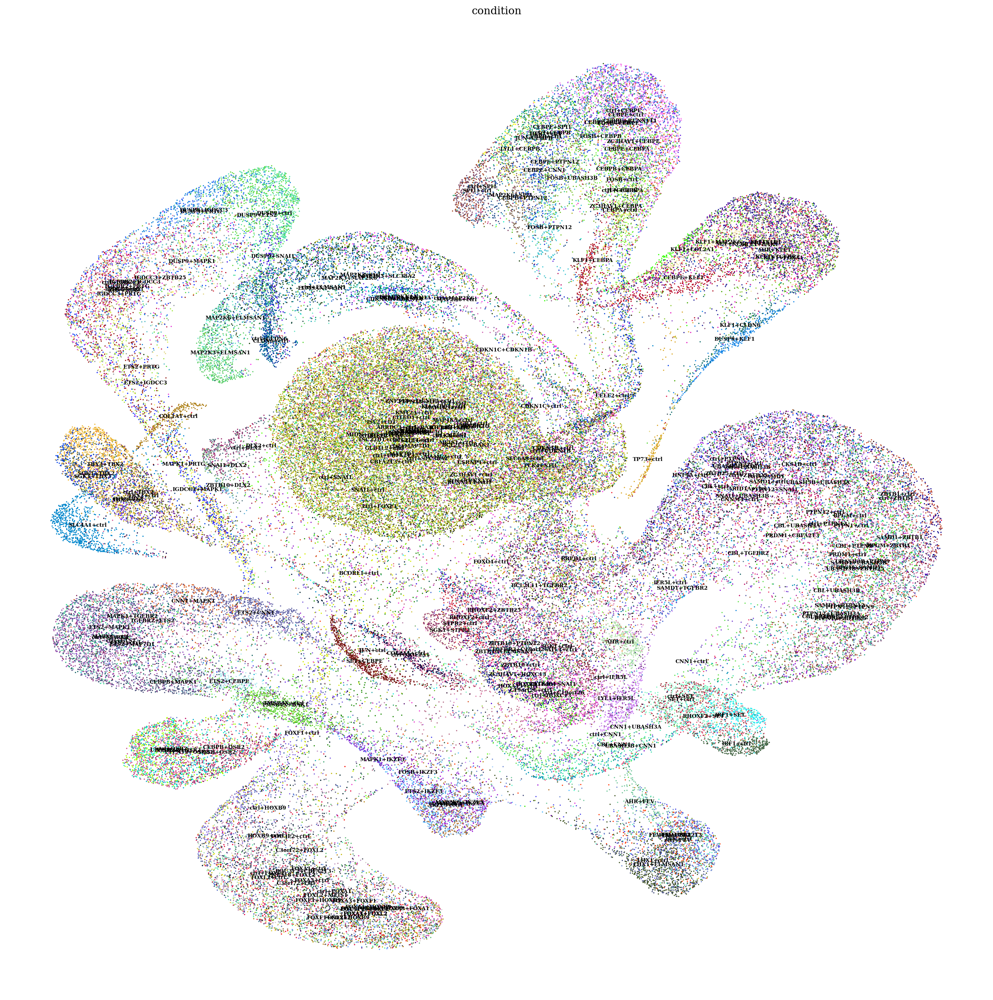

In [12]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()

In [13]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

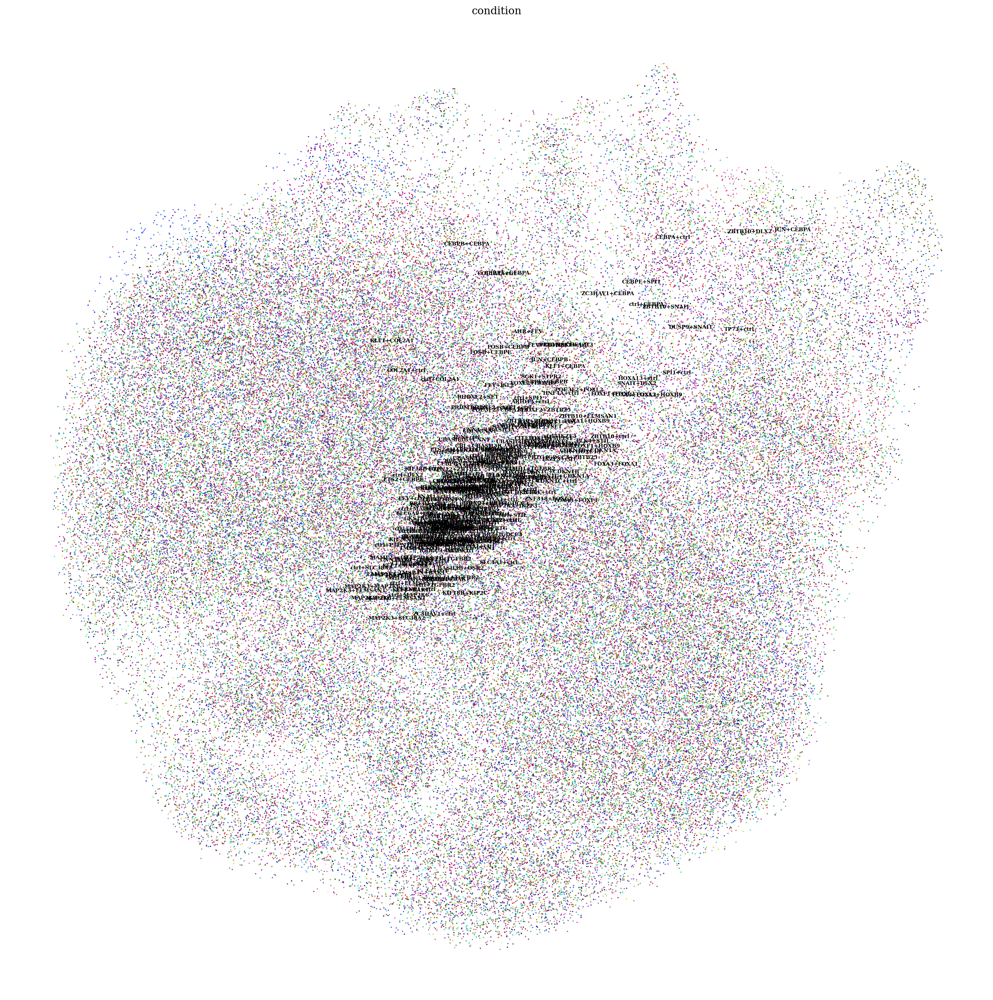

In [14]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()